## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Libraries</p>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
from copy import deepcopy
from functools import partial
from itertools import combinations
import random
import gc
import time
import math

# Import sklearn classes for model selection, cross validation, and performance evaluation
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
import seaborn as sns
from category_encoders import OrdinalEncoder, CountEncoder, CatBoostEncoder, OneHotEncoder
from sklearn.preprocessing import FunctionTransformer, LabelEncoder # OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.under_sampling import RandomUnderSampler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.decomposition import PCA, NMF
from umap import UMAP
from sklearn.decomposition import FastICA
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
import shap

# Import libraries for Hypertuning
import optuna

# Import libraries for gradient boosting
import lightgbm as lgb
import xgboost as xgb
from xgboost.callback import EarlyStopping
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier, GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier, AdaBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.svm import NuSVC, SVC
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process.kernels import RBF
from catboost import CatBoost, CatBoostRegressor, CatBoostClassifier
from catboost import Pool

from sklearn.feature_selection import RFE, RFECV
from sklearn.inspection import permutation_importance

# Suppress warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings('ignore', '.*DataFrame is highly fragmented*')

from colorama import Style, Fore
blk = Style.BRIGHT + Fore.BLACK
red = Style.BRIGHT + Fore.RED
blu = Style.BRIGHT + Fore.BLUE
res = Style.RESET_ALL

2023-07-02 00:28:49.765443: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.

2023-07-02 00:28:49.789991: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.

To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.

2023-07-02 00:28:50.138825: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Data</p>

In [2]:
# Load Data
filepath = '/kaggle/input/playground-series-s3e18'
generated_filepath = '/kaggle/input/ec-mixed-class'

df_train = pd.read_csv(os.path.join(filepath, 'train.csv'), index_col=[0])
df_test = pd.read_csv(os.path.join(filepath, 'test.csv'), index_col=[0])
original = pd.read_csv(os.path.join(generated_filepath, 'mixed_desc.csv'), index_col=[0])
# original_ecfp = pd.read_csv(os.path.join(generated_filepath, 'mixed_ecfp.csv'), index_col=[0])
# original3_fcfp = pd.read_csv(os.path.join(generated_filepath, 'mixed_fcfp.csv'), index_col=[0])

# Preprocessing for original
df = original['EC1_EC2_EC3_EC4_EC5_EC6'].str.split('_').reset_index()
df_expanded = pd.DataFrame(df['EC1_EC2_EC3_EC4_EC5_EC6'].tolist(), columns=[f'EC{i+1}' for i in range(len(df['EC1_EC2_EC3_EC4_EC5_EC6'].iloc[0]))])
df_expanded['CIDs'] = df['CIDs']
df_expanded = df_expanded[['CIDs'] + [f'EC{i+1}' for i in range(len(df['EC1_EC2_EC3_EC4_EC5_EC6'].iloc[0]))]]
df_expanded.set_index('CIDs', inplace=True)
original = pd.concat([original[df_test.columns], df_expanded], axis=1)

# Define columns
# num_cols = df_test.select_dtypes(include=['int64', 'float64']).columns.tolist()
# cat_cols = df_test.select_dtypes(include=['object']).columns.tolist()
target_cols = [
    'EC1', 
    'EC2'
]
num_cols = [
    'BertzCT',
    'Chi1',
    'Chi1n',
    'Chi1v',
    'Chi2n',
    'Chi2v',
    'Chi3v',
    'Chi4n',
    'EState_VSA1',
    'EState_VSA2',
    'ExactMolWt',
    'FpDensityMorgan1',
    'FpDensityMorgan2',
    'FpDensityMorgan3',
    'HallKierAlpha',
    'HeavyAtomMolWt',
    'Kappa3',
    'MaxAbsEStateIndex',
    'MinEStateIndex',
    'NumHeteroatoms',
    'PEOE_VSA10',
    'PEOE_VSA14',
    'PEOE_VSA6',
    'PEOE_VSA7',
    'PEOE_VSA8',
    'SMR_VSA10',
    'SMR_VSA5',
    'SlogP_VSA3',
    'VSA_EState9',
    'fr_COO',
    'fr_COO2',
    ]
binary_cols = [
    'EC3',
    'EC4',
    'EC5',
    'EC6',
]

df_train['is_generated'] = 1
df_test['is_generated'] = 1
original['is_generated'] = 0

print(f"train shape :{df_train.shape}, ", f"test shape :{df_test.shape}")
print(f"original shape :{original.shape}")

train shape :(14838, 38),  test shape :(9893, 32)

original shape :(1039, 38)


In [3]:
def set_frame_style(df, caption=""):
    """Helper function to set dataframe presentation style.
    """
    return df.style.background_gradient(cmap='Blues').set_caption(caption).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'Blue'),
        ('font-size', '18px'),
        ('font-weight','bold')
    ]}])

def check_data(data, title):
    cols = data.columns.to_list()
    display(set_frame_style(data[cols].head(),f'{title}: First 5 Rows Of Data'))
    display(set_frame_style(data[cols].describe(),f'{title}: Summary Statistics'))
    display(set_frame_style(data[cols].nunique().to_frame().rename({0:'Unique Value Count'}, axis=1).transpose(), f'{title}: Unique Value Counts In Each Column'))
    display(set_frame_style(data[cols].isna().sum().to_frame().transpose(), f'{title}:Columns With Nan'))
    
check_data(df_train, 'Train data')
print('-'*100)
check_data(df_test, 'Test data')
print('-'*100)
check_data(original, 'Original data')

,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,323.390782,9.879918,5.875576,5.875576,4.304757,4.304757,2.754513,1.749203,0.000000,11.938294,222.068080,1.181818,1.727273,2.363636,-0.240000,212.163000,8.170000,11.922504,0.171585,4,0.000000,91.536492,0.000000,0.000000,0.000000,17.744066,0.000000,4.794537,35.527357,0,0,1,1,0,0,0,0,1
1,273.723798,7.259037,4.441467,5.834958,3.285046,4.485235,2.201375,1.289775,45.135471,0.000000,260.029719,1.346154,2.076923,2.769231,-0.090000,247.031000,3.201491,10.932338,-4.830450,10,24.415866,7.822697,0.000000,0.000000,0.000000,7.822697,30.705892,13.825658,44.707310,0,0,0,1,1,0,0,0,1
2,521.643822,10.911303,8.527859,11.050864,6.665291,9.519706,5.824822,1.770579,15.645394,6.606882,382.131027,1.085714,1.742857,2.400000,-0.780000,354.106000,15.033890,11.238048,-5.066255,9,0.000000,15.645394,0.000000,53.378235,0.000000,15.645394,73.143616,17.964475,45.660120,0,0,1,1,0,0,1,0,1
3,567.431166,12.453343,7.089119,12.833709,6.478023,10.978151,7.914542,3.067181,95.639554,0.000000,530.070277,1.162791,1.573770,2.270270,-1.300000,506.124000,6.724301,11.171170,-5.276575,19,42.727765,21.335138,0.000000,0.000000,6.420822,15.645394,62.107304,31.961948,87.509997,0,0,1,1,0,0,0,0,1
4,112.770735,4.414719,2.866236,2.866236,1.875634,1.875634,1.036450,0.727664,17.980451,12.841643,118.062994,1.444444,2.111111,2.555556,-1.100000,108.056000,3.931272,9.855741,-1.676296,4,6.041841,11.938611,6.923737,19.386400,0.000000,11.938611,18.883484,9.589074,33.333333,2,2,1,0,1,1,1,0,1


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
count,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000,14838.000000
mean,515.153604,9.135189,5.854307,6.738497,4.432570,5.253221,3.418749,1.773472,29.202823,10.435316,292.623087,1.236774,1.812070,2.255470,-1.207776,274.950211,5.874372,10.556443,-2.119772,8.584108,11.021644,17.790011,8.962440,11.318811,6.704487,15.666766,31.066423,13.636941,49.309959,0.458215,0.459226,0.667745,0.798962,0.313789,0.279081,0.144831,0.151570,1.000000
std,542.456370,6.819989,4.647064,5.866444,3.760516,4.925065,3.436208,1.865898,31.728679,13.651843,225.384140,5.491284,5.495565,5.501200,0.935314,212.678755,45.730226,1.559331,2.066415,7.643769,13.958962,34.561655,19.756727,20.169745,10.865415,18.080208,33.896638,14.598554,29.174824,0.667948,0.668111,0.471038,0.400790,0.464047,0.448562,0.351942,0.358616,0.000000
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007276,-666.000000,-666.000000,-666.000000,-7.730000,0.000000,-104.040000,0.000000,-6.327514,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.430556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,149.103601,4.680739,2.844556,2.932842,1.949719,2.034468,1.160763,0.503897,5.969305,0.000000,148.037173,1.045455,1.690909,2.100000,-1.660000,136.109000,1.784008,9.926190,-4.659604,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.969305,6.420822,4.794537,30.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,290.987941,6.485270,4.052701,4.392859,2.970427,3.242775,1.948613,1.073261,17.353601,6.420822,206.042653,1.250000,1.865152,2.358491,-1.100000,194.276500,3.261011,10.421334,-1.265370,6.000000,6.041841,5.969305,0.000000,0.000000,0.000000,11.752550,20.075376,9.589074,41.666667,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,652.652585,11.170477,7.486791,8.527859,5.788793,6.609350,4.502070,2.534281,44.876559,12.841643,343.090331,1.500000,2.062153,2.500000,-0.570000,326.002000,5.848400,11.539743,-0.787037,10.000000,18.311899,15.645394,12.132734,13.847474,6.923737,17.721856,42.727765,14.912664,56.090650,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,4069.959780,69.551167,50.174588,53.431954,32.195368,34.579313,22.880836,16.072810,363.705954,99.936429,2237.318490,3.000000,3.200000,3.400000,0.820000,2035.133000,1512.242231,15.630251,6.000000,42.000000,97.663462,482.434223,375.425148,211.501279,100.348416,80.742293,492.729739,115.406157,384.450519,8.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
Unique Value Count,2368,1259,3157,3306,3634,3725,3448,2930,719,445,1666,556,650,654,388,860,2245,2356,2142,40,250,291,219,262,237,409,492,217,1946,8,8,2,2,2,2,2,2,1


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


----------------------------------------------------------------------------------------------------


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,is_generated
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
14838,344.632371,7.283603,4.473966,5.834958,3.412257,4.651530,2.096558,1.116433,49.458581,0.000000,204.079707,1.384615,1.923077,2.307692,-0.240000,192.197000,3.247123,10.248693,-4.734642,7,18.311899,13.512441,0.000000,0.000000,0.000000,26.809272,24.539800,4.794537,47.304082,1,1,1
14839,1432.410201,10.663869,7.079026,8.065215,5.297097,5.297097,3.924155,2.569694,0.000000,29.783175,315.210331,0.571429,0.857143,1.159286,-1.810000,280.263000,10.070000,11.917927,-0.303333,4,0.000000,0.000000,34.947374,98.323987,9.606882,0.000000,53.378235,0.000000,43.166667,0,0,1
14840,83.352608,3.931852,1.774215,1.774215,1.073446,1.073446,0.467830,0.170838,5.969305,6.420822,101.047679,1.500000,2.200000,2.400000,-0.860000,94.049000,5.430000,9.694444,-0.833333,3,0.000000,5.969305,0.000000,0.000000,6.420822,11.752550,13.344559,9.589074,24.666667,1,1,1
14841,150.255712,5.912790,3.548812,3.548812,2.595128,2.595128,1.642813,0.694113,0.000000,0.000000,187.115661,1.625000,2.500000,2.875000,-0.570000,168.111000,3.453383,10.215871,0.291343,6,0.000000,59.935299,0.000000,0.000000,0.000000,17.744066,32.290168,4.794537,26.778866,0,0,1
14842,1817.276351,24.910940,15.540529,20.047314,12.535886,17.730988,11.979618,4.431173,84.554972,47.360206,891.167638,1.056604,1.716981,2.358491,-2.440000,847.328000,8.424399,12.642250,-5.570647,20,36.259886,23.468091,25.609359,0.000000,37.099000,69.141353,38.704130,50.697492,102.583333,0,0,1


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,is_generated
count,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000,9893.000000
mean,516.411916,9.106998,5.848047,6.733659,4.428979,5.247994,3.401083,1.750078,28.956335,10.534500,292.006497,1.280917,1.861792,2.304095,-1.206781,274.583106,5.280890,10.555415,-2.098765,8.590215,11.033200,18.493154,8.917260,11.222822,6.789234,15.810550,30.919849,13.601593,49.426755,0.459719,0.461235,1.000000
std,544.327795,6.754583,4.641662,5.863886,3.770031,4.939702,3.431766,1.837159,31.470865,13.768117,224.667454,0.361229,0.348650,0.382551,0.923173,212.321052,37.349006,1.572745,2.059608,7.660447,13.905575,35.832279,19.358857,20.015732,10.778071,18.265549,33.532665,14.689893,29.542758,0.676657,0.677194,0.000000
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.007276,-1.133333,0.416667,0.361111,-7.620000,14.007000,-104.040000,0.000000,-6.117075,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.061146,0.000000,0.000000,1.000000
25%,150.255712,4.698377,2.846050,2.934030,1.949719,2.049137,1.171060,0.508512,5.969305,0.000000,148.073559,1.043478,1.692308,2.100000,-1.680000,140.050000,1.788507,9.946009,-4.638889,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.969305,6.420822,4.794537,30.000000,0.000000,0.000000,1.000000
50%,289.901774,6.447265,4.009996,4.337841,2.930013,3.168052,1.923982,1.058931,17.282269,6.420822,206.021523,1.250000,1.866667,2.358491,-1.100000,194.125000,3.261011,10.418624,-1.252751,6.000000,6.041841,5.969305,0.000000,5.563451,0.000000,11.752550,19.765380,9.589074,41.666667,0.000000,0.000000,1.000000
75%,652.758463,10.966946,7.490880,8.528316,5.788793,6.516914,4.302610,2.509394,44.876559,12.841643,342.116212,1.500000,2.071429,2.520000,-0.570000,320.121000,5.772640,11.526326,-0.787037,10.000000,18.311899,17.907916,12.132734,13.344559,6.923737,17.744066,42.727765,14.383612,56.083333,1.000000,1.000000,1.000000
max,3919.541449,53.876516,43.283925,53.990574,36.368883,44.726398,26.736931,15.620667,363.705954,99.936429,1888.793611,3.000000,3.200000,3.375000,0.830000,1758.846000,1512.242231,14.630251,4.750000,53.000000,122.017202,482.434223,258.844527,271.424271,96.917997,79.920667,492.729739,115.406157,384.450519,8.000000,8.000000,1.000000


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,is_generated
Unique Value Count,1811,1047,2473,2604,2806,2858,2644,2249,582,380,1415,464,562,559,356,767,1775,1924,1751,40,210,249,185,232,214,359,424,192,1529,7,7,1


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,is_generated
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


----------------------------------------------------------------------------------------------------


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
CIDs,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
C00009,49.783540,2.000000,0.782574,2.347723,0.513277,1.539831,0.000000,0.000000,7.822697,0.000000,97.976895,1.200000,1.200000,1.200000,0.110000,94.970000,1512.242231,8.881944,-4.638889,5,0.000000,7.822697,0.000000,0.000000,0.000000,7.822697,0.000000,4.565048,16.923611,0,0,1,1,1,1,0,1,0
C00013,147.355172,3.707107,1.530297,4.590890,1.062804,3.678309,1.914534,0.138556,15.645394,0.000000,177.943226,0.888889,1.111111,1.111111,0.260000,173.941000,8.260000,9.626875,-5.050347,9,0.000000,15.645394,0.000000,0.000000,0.000000,15.645394,0.000000,13.440728,20.899028,0,0,1,1,1,1,0,1,0
C00014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.150546,17.026549,1.000000,1.000000,1.000000,-0.040000,14.007000,-104.040000,0.000000,0.000000,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,1,1,1,1,0,1,0
C00017,172.720106,4.947265,2.081214,2.081214,1.157830,1.157830,0.489278,0.180980,12.514062,12.451936,130.037842,1.777778,2.333333,2.666667,-1.100000,124.055000,1.394403,10.860741,-0.931481,7,0.000000,50.712056,0.000000,0.000000,0.000000,11.876485,13.089513,9.589074,35.105740,1,1,0,1,1,0,0,0,0
C00022,72.039100,2.642734,1.381855,1.381855,0.861339,0.861339,0.301176,0.000000,11.752550,0.000000,88.016044,1.500000,1.666667,1.666667,-0.860000,84.030000,1.458471,9.543981,-1.379630,3,0.000000,5.969305,0.000000,0.000000,6.923737,11.752550,6.923737,9.589074,25.333333,1,1,1,1,1,1,0,1,0


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,is_generated
count,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000
mean,600.899967,10.475362,6.878399,7.971644,5.277378,6.303263,4.182612,2.280429,33.718436,12.667721,333.931220,0.605142,1.155248,1.590101,-1.345309,313.867772,10.097855,10.499468,-2.134840,9.459095,12.799799,23.903545,14.447252,15.719315,8.617909,18.593662,39.537253,15.608161,54.300764,0.477382,0.483157,0.000000
std,657.372433,8.818062,6.304016,7.413228,5.039212,6.123113,4.344008,2.610461,39.498473,16.444265,282.251633,20.704697,20.722175,20.736673,1.224385,264.813450,71.412274,2.093834,2.154017,8.676703,16.436686,47.728827,30.857185,27.380871,13.429493,20.522116,50.790411,17.240011,40.316334,0.819569,0.820883,0.000000
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007276,-666.000000,-666.000000,-666.000000,-7.730000,0.000000,-104.040000,0.000000,-6.426912,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-10.031250,0.000000,0.000000,0.000000
25%,150.187348,4.689558,2.841119,3.082571,1.977220,2.190495,1.220149,0.516013,5.969305,0.000000,149.047678,1.000000,1.552778,2.000000,-1.855000,140.050000,1.918210,9.872616,-4.604473,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.969305,6.606882,4.794537,29.333333,0.000000,0.000000,0.000000
50%,315.695337,7.221033,4.381691,5.238370,3.293263,3.962970,2.373199,1.210108,18.115112,6.420822,227.090606,1.200000,1.818182,2.307692,-1.100000,215.033000,3.624803,10.504174,-1.321759,6.000000,6.041841,7.822697,0.000000,6.076020,0.000000,11.938611,24.539800,9.589074,42.916667,0.000000,0.000000,0.000000
75%,817.829979,13.674485,9.422825,10.280502,7.421074,8.606371,6.142604,3.337162,46.285437,17.248535,425.594605,1.486842,2.074176,2.537523,-0.530000,399.691500,7.228611,11.836323,-0.702431,12.000000,22.905017,23.468091,18.199101,18.730976,12.263211,21.428639,57.470539,19.178149,69.742720,1.000000,1.000000,0.000000
max,4069.959780,73.268031,58.849286,61.909880,43.047148,45.431092,30.328509,20.406255,363.705954,99.936429,2237.335998,3.000000,3.200000,3.400000,0.960000,2035.133000,1512.242231,15.806092,6.000000,53.000000,122.017202,482.434223,375.425148,271.424271,100.348416,95.824381,624.267646,115.406157,384.450519,8.000000,8.000000,0.000000


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
Unique Value Count,858,605,903,912,908,917,896,853,398,263,796,324,362,384,299,603,812,924,918,42,166,176,155,173,146,248,327,159,768,7,7,2,2,2,2,2,2,1


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6,is_generated
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">EDA</p>
**Contents:**
1. Train, Test and Original data histograms
2. Correlation of Features
3. Hierarchical Clustering
4. Pie and bar charts for Target column features
7. Boxplot by Machine failure
8. Violinplot by Machine failure
9. Scatter plots after dimensionality reduction with PCA by Target and fr_COO, fr_COO2

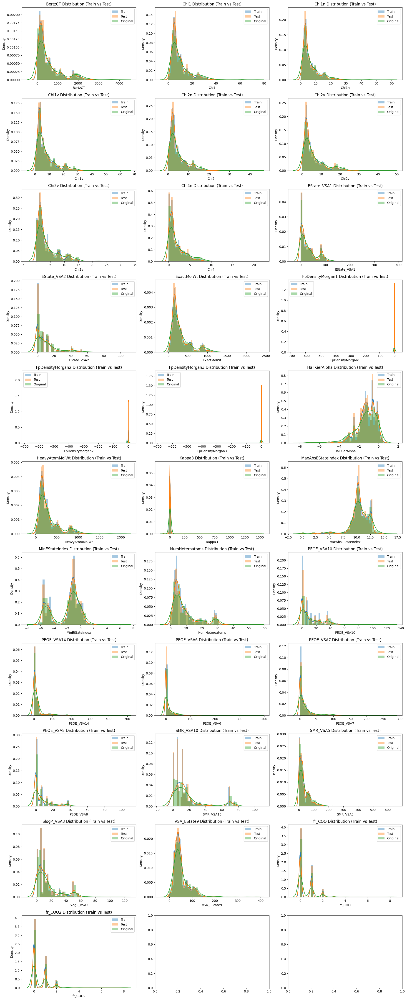

In [4]:
def plot_histograms(df_train, df_test, original, target_col, n_cols=3):
    n_rows = (len(df_train.columns) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))
    axes = axes.flatten()

    for i, var_name in enumerate(df_train.columns.tolist()):
        if var_name != 'is_generated':
            ax = axes[i]
            sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
            if var_name != target_col:
                sns.distplot(df_test[var_name], kde=True, ax=ax, label='Test')
            sns.distplot(original[var_name], kde=True, ax=ax, label='Original')
            ax.set_title(f'{var_name} Distribution (Train vs Test)')
            ax.legend()

    plt.tight_layout()
    plt.show()
        
plot_histograms(df_train[num_cols], df_test[num_cols], original[num_cols], target_cols[0], n_cols=3)

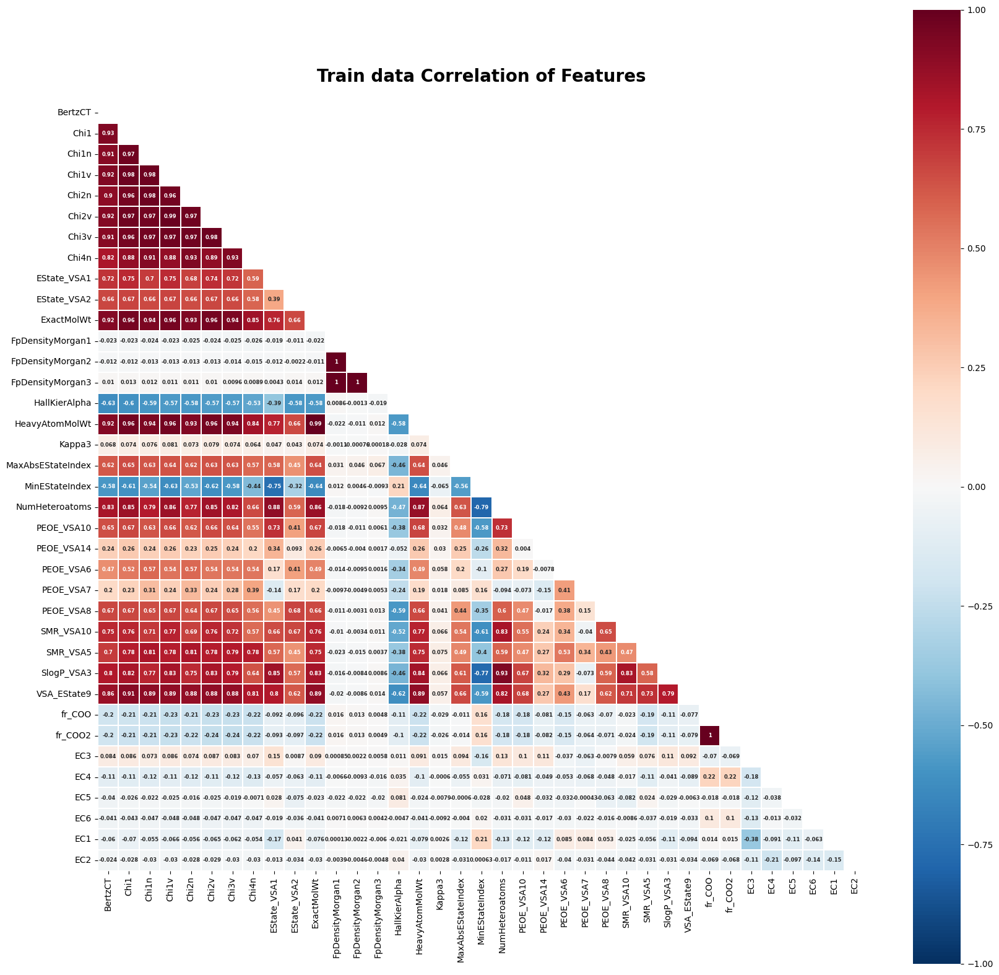

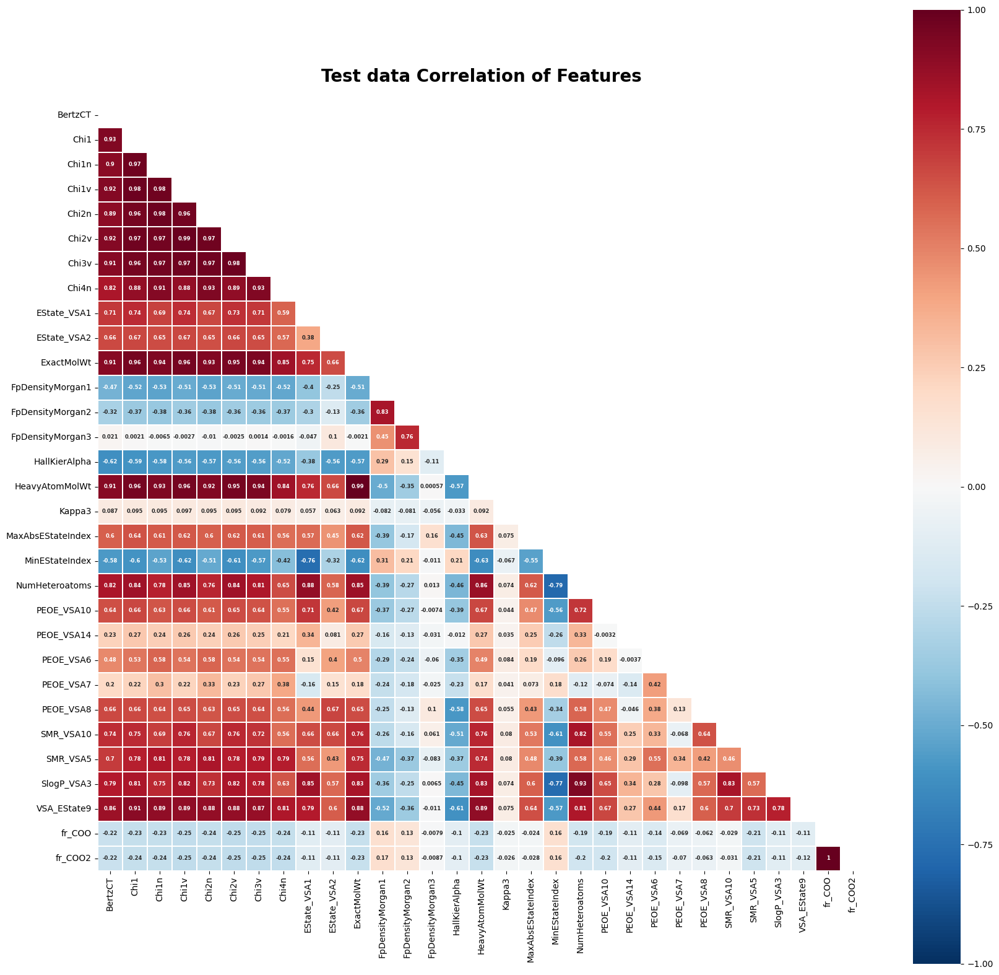

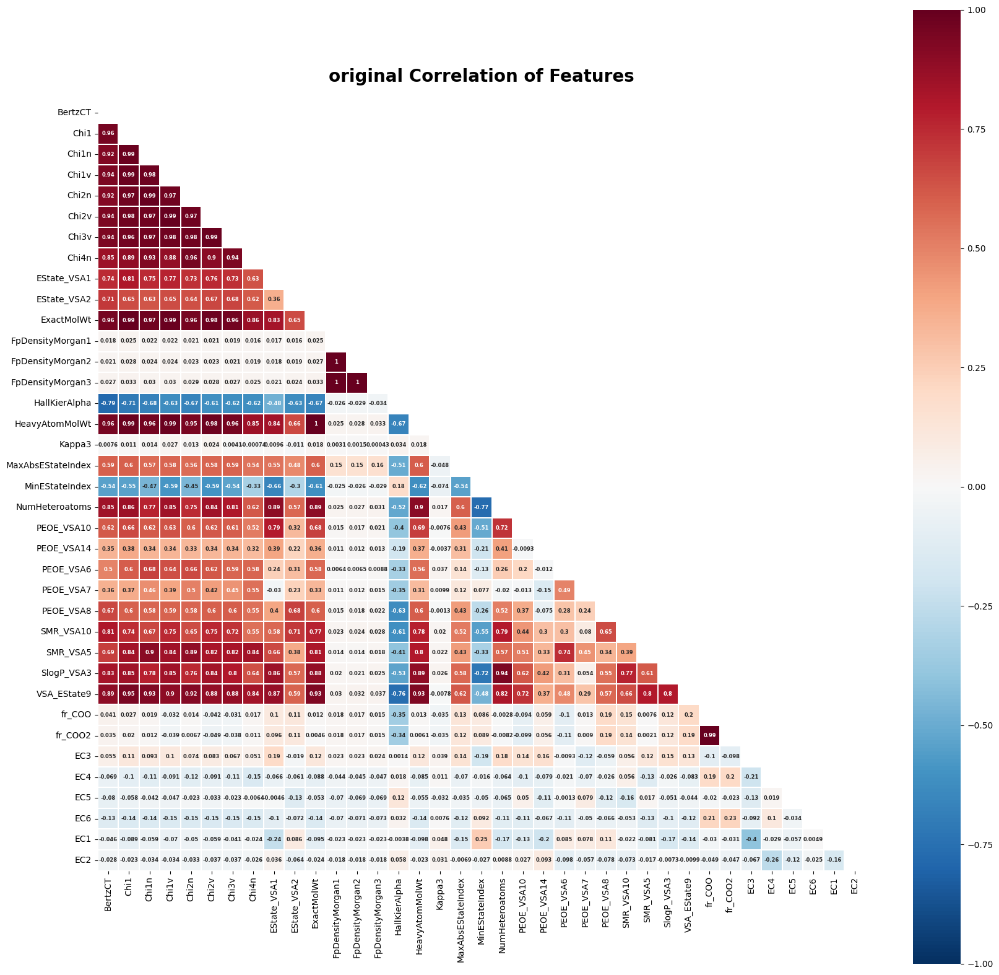

In [5]:
def plot_heatmap(df, title, figsize=(20, 20), fontsize=6):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    # Set the colormap and figure size
    colormap = plt.cm.RdBu_r
    plt.figure(figsize=figsize)

    # Set the title and font properties
    plt.title(f'{title} Correlation of Features', fontweight='bold', y=1.02, size=20)

    # Plot the heatmap with the masked diagonal elements
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0, 
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": fontsize, "weight": "bold"},
                mask=mask)

plot_heatmap(df_train[num_cols+binary_cols+target_cols], title='Train data')
plot_heatmap(df_test[num_cols], title='Test data')
plot_heatmap(original[num_cols+binary_cols+target_cols], title='original')

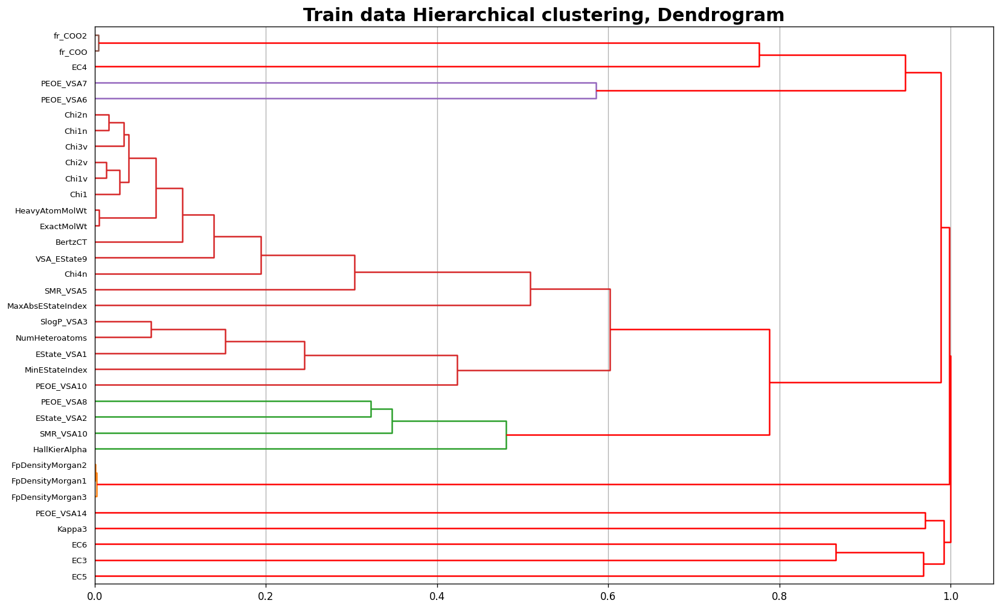

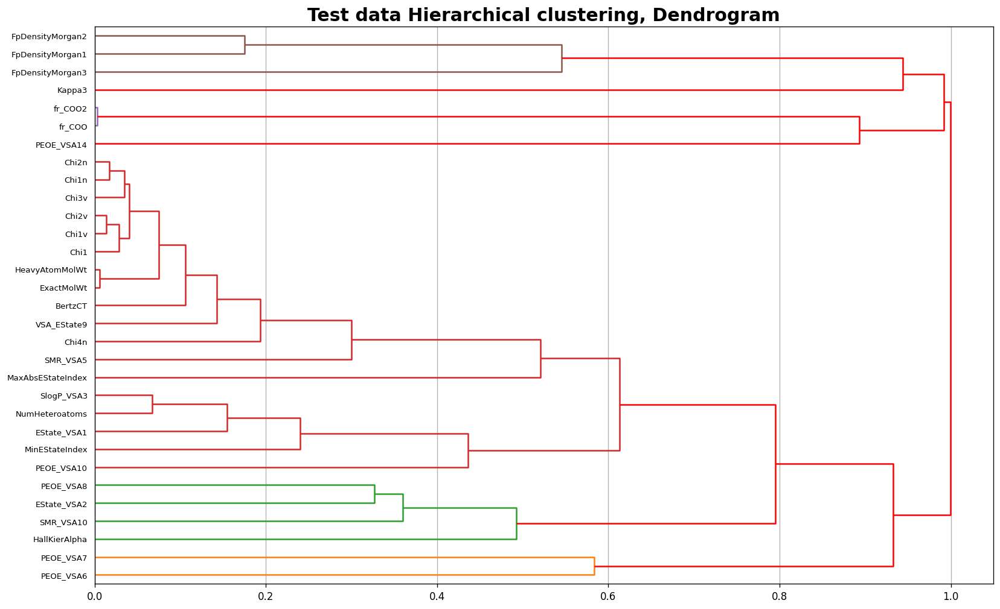

In [6]:
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

def hierarchical_clustering(data, title):
    fig, ax = plt.subplots(1, 1, figsize=(16, 10), dpi=120)
    correlations = data.corr()
    converted_corr = 1 - np.abs(correlations)
    Z = linkage(squareform(converted_corr), 'complete')
    
    dn = dendrogram(Z, labels=data.columns, ax=ax, above_threshold_color='#ff0000', orientation='right')
    hierarchy.set_link_color_palette(None)
    plt.grid(axis='x')
    plt.title(f'{title} Hierarchical clustering, Dendrogram', fontsize=18, fontweight='bold')
    plt.show()

hierarchical_clustering(df_train[num_cols+binary_cols], title='Train data')
hierarchical_clustering(df_test[num_cols], title='Test data')

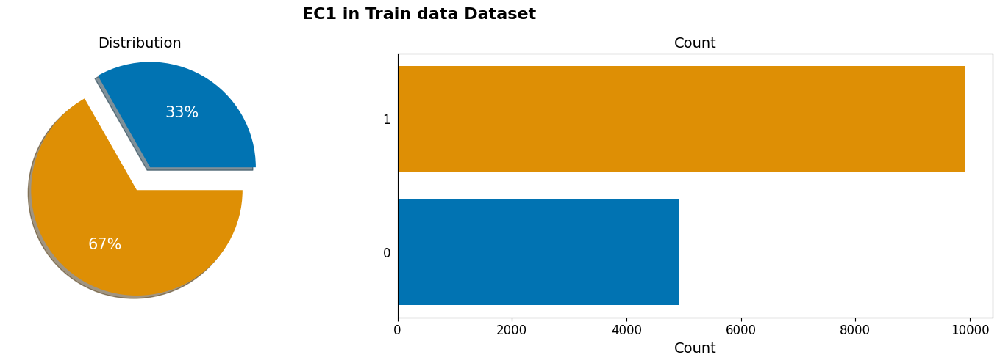

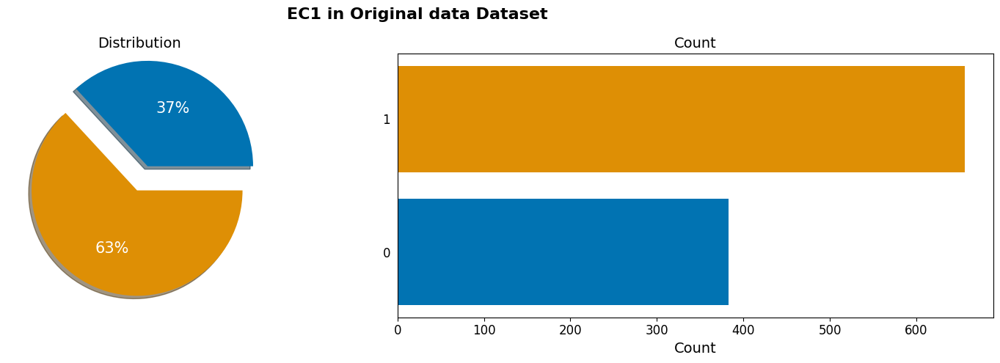

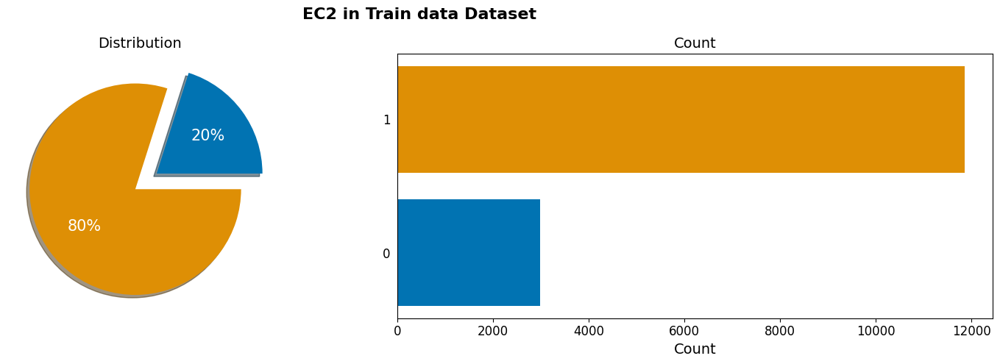

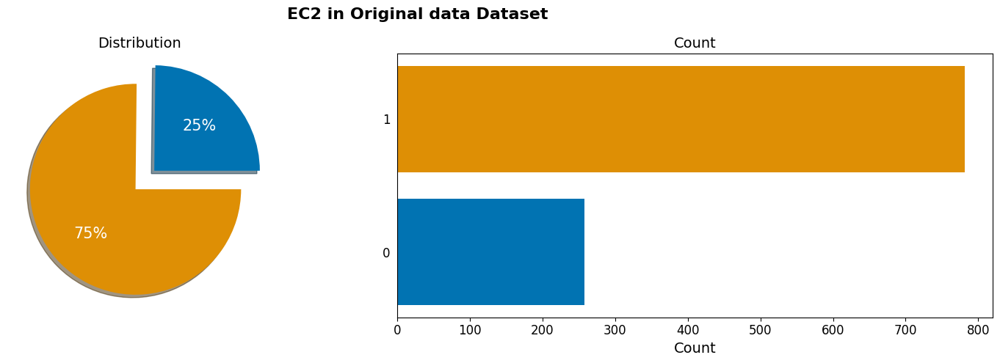

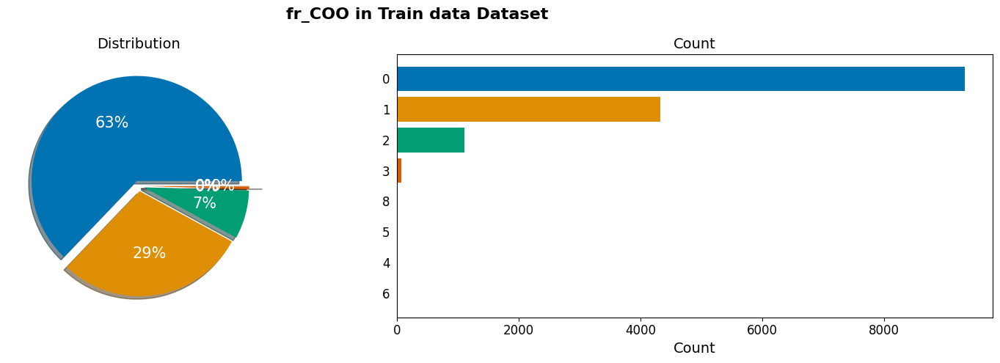

In [7]:
def plot_target_feature(df_train, target_col, figsize=(16,5), palette='colorblind', name='Train'):
    df_train = df_train.fillna('Nan')

    fig, ax = plt.subplots(1, 2, figsize=figsize)
    ax = ax.flatten()

    # Get unique categories and their counts
    unique_categories, category_counts = np.unique(df_train[target_col], return_counts=True)

    # Pie chart
    pie_colors = sns.color_palette(palette, len(unique_categories))
    pie_explode = [0.05] * len(unique_categories)
    min_category_index = np.argmin(category_counts)
    pie_explode[min_category_index] = 0.2

    ax[0].pie(
        category_counts,
        shadow=True,
        explode=pie_explode,
        autopct='%1.f%%',
        textprops={'size': 15, 'color': 'white'},
        colors=pie_colors
    )
    ax[0].set_aspect('equal')
    ax[0].set_title('Distribution', fontsize=14)

    # Bar plot
    bar_colors = sns.color_palette(palette, len(unique_categories))
    bar_indices = np.argsort(category_counts)
    bar_data = category_counts[bar_indices]
    bar_labels = unique_categories[bar_indices]

    ax[1].barh(
        range(len(bar_labels)),  # Use range of indices as y-values
        bar_data,
        color=[bar_colors[i] for i in bar_indices]
    )
    ax[1].set_yticks(range(len(bar_labels)))  # Set y-ticks at the center of each bar
    ax[1].set_yticklabels(bar_labels)  # Set the correct category labels
    ax[1].set_xlabel('Count', fontsize=14)
    ax[1].set_ylabel('')
    ax[1].tick_params(labelsize=12)
    ax[1].yaxis.set_tick_params(width=0)
    ax[1].set_title('Count', fontsize=14)

    fig.suptitle(f'{target_col} in {name} Dataset', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
plot_target_feature(df_train, target_cols[0], figsize=(16,5), palette='colorblind', name='Train data')
plot_target_feature(original, target_cols[0], figsize=(16,5), palette='colorblind', name='Original data')
plot_target_feature(df_train, target_cols[1], figsize=(16,5), palette='colorblind', name='Train data')
plot_target_feature(original, target_cols[1], figsize=(16,5), palette='colorblind', name='Original data')
plot_target_feature(df_train, 'fr_COO', figsize=(16,5), palette='colorblind', name='Train data')

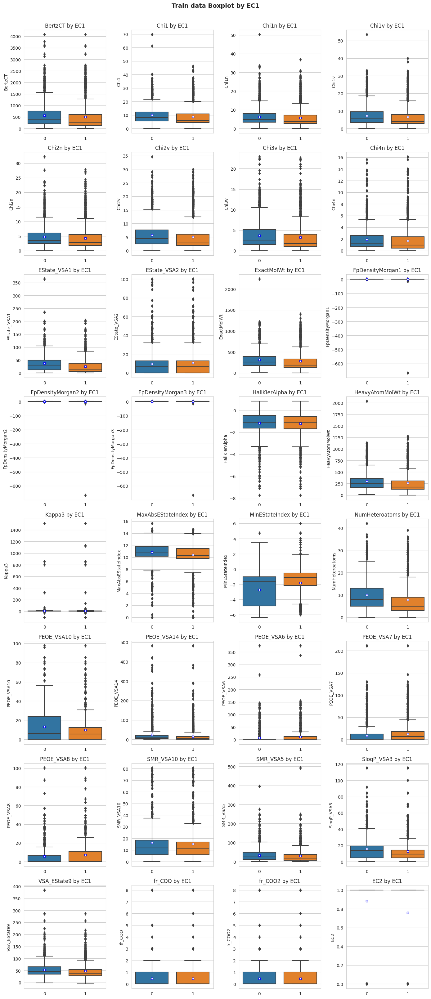

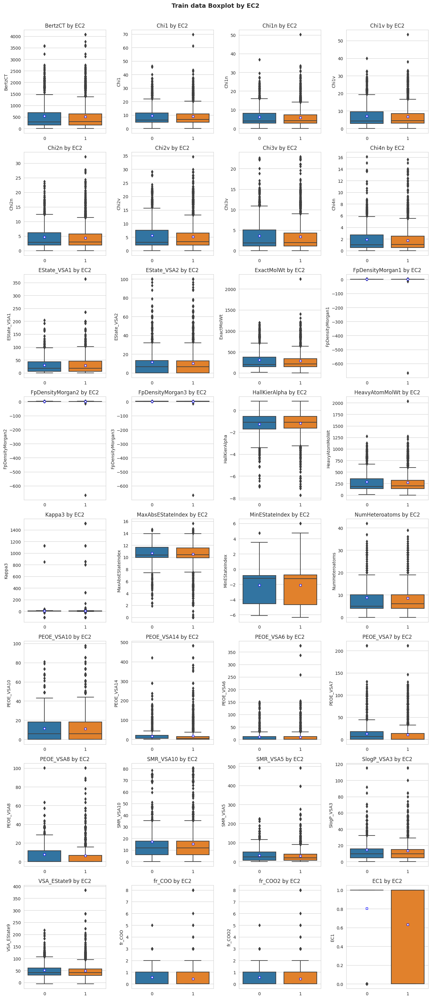

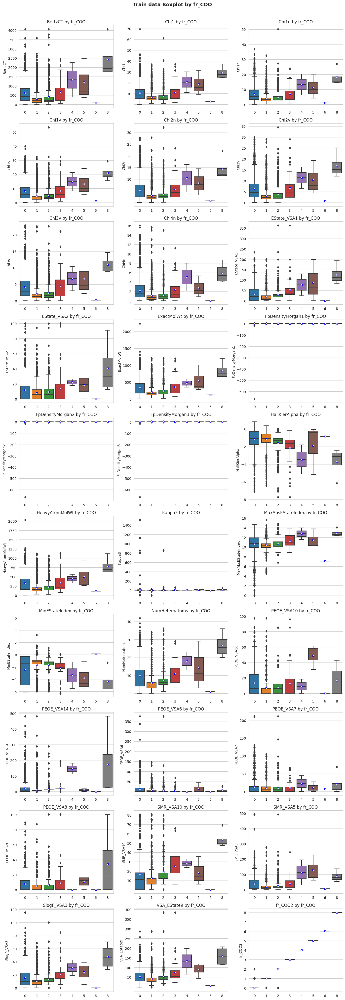

In [8]:
def plot_boxplot(df, hue, drop_cols=[], n_cols=3, title=''):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.boxplot(data=df, x=hue, y=var_name, ax=ax, showmeans=True, 
                    meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue", "markersize":"5"})
        ax.set_title(f'{var_name} by {hue}')
        ax.set_xlabel('')

    fig.suptitle(f'{title} Boxplot by {hue}', fontweight='bold', fontsize=14, y=1.005)
    plt.tight_layout()
    plt.show()
    
plot_boxplot(df_train[num_cols+target_cols], hue=target_cols[0], n_cols=4, title='Train data')
plot_boxplot(df_train[num_cols+target_cols], hue=target_cols[1], n_cols=4, title='Train data')
plot_boxplot(df_train[num_cols], hue='fr_COO', n_cols=3, title='Train data')

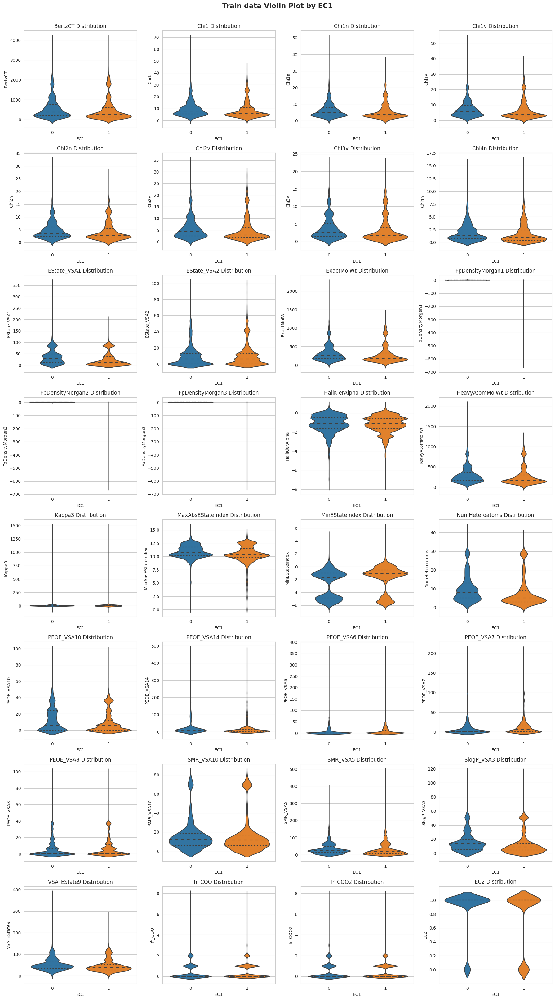

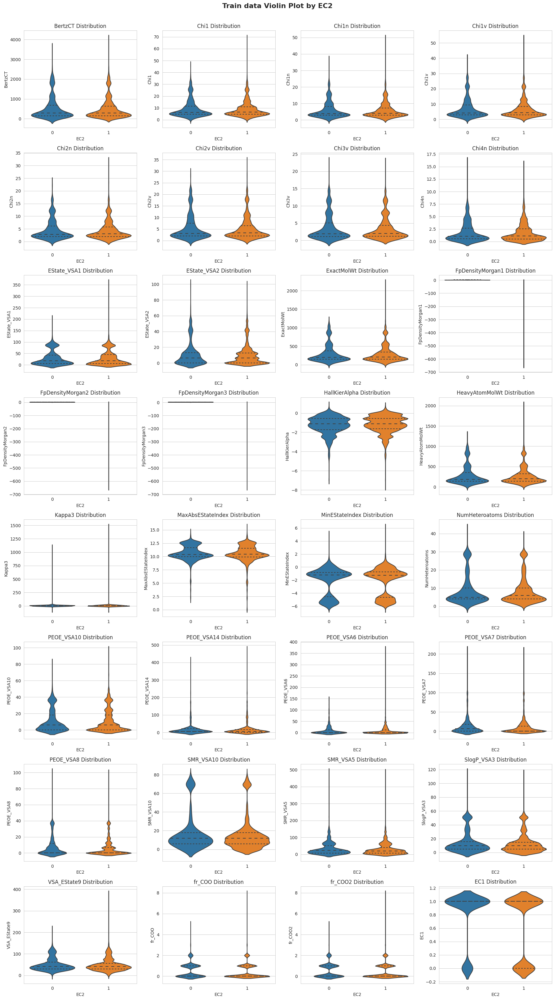

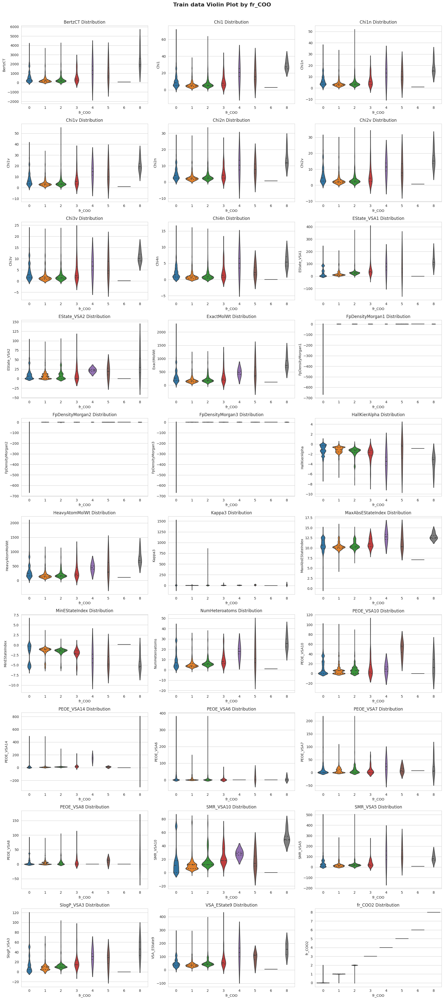

In [9]:
def plot_violinplot(df, hue, drop_cols=[], n_cols=2, title=''):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.violinplot(data=df, x=hue, y=var_name, ax=ax, inner='quartile')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Violin Plot by {hue}', fontweight='bold', fontsize=16, y=1.005)
    plt.tight_layout()
    plt.show()
    
plot_violinplot(df_train[num_cols+target_cols], hue=target_cols[0], n_cols=4, title='Train data')
plot_violinplot(df_train[num_cols+target_cols], hue=target_cols[1], n_cols=4, title='Train data')
plot_violinplot(df_train[num_cols], hue='fr_COO', n_cols=3, title='Train data')

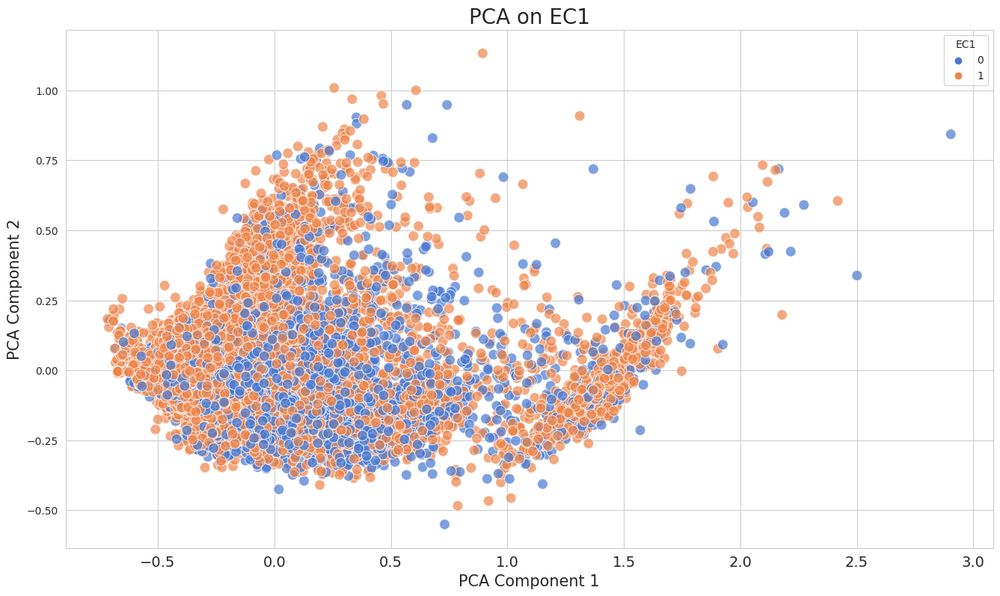

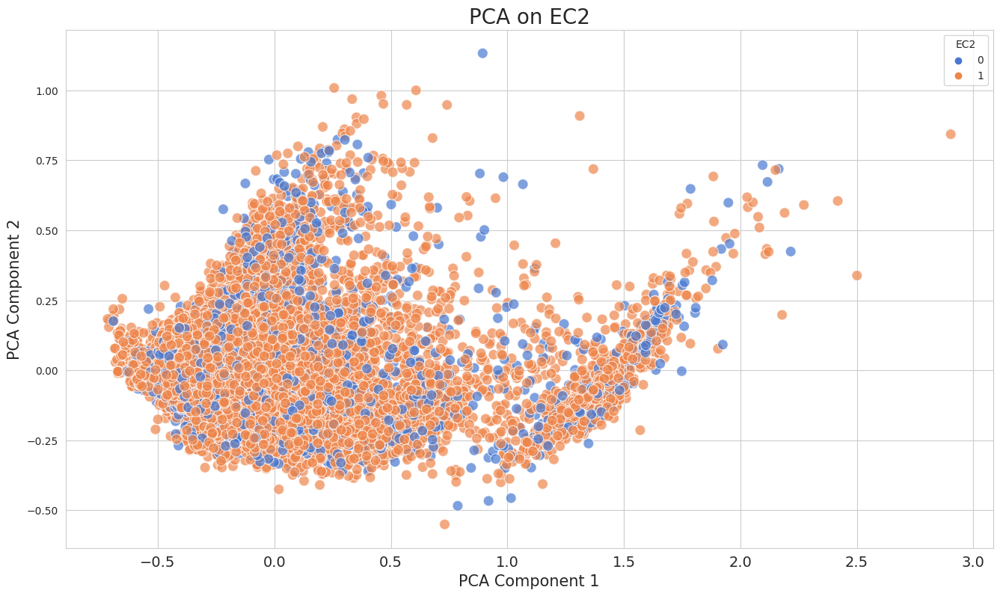

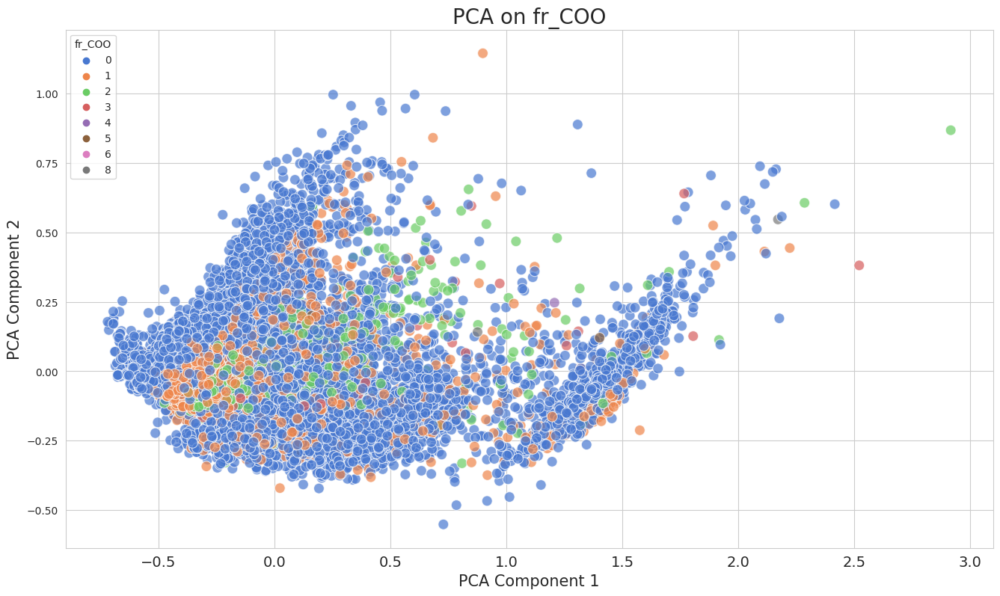

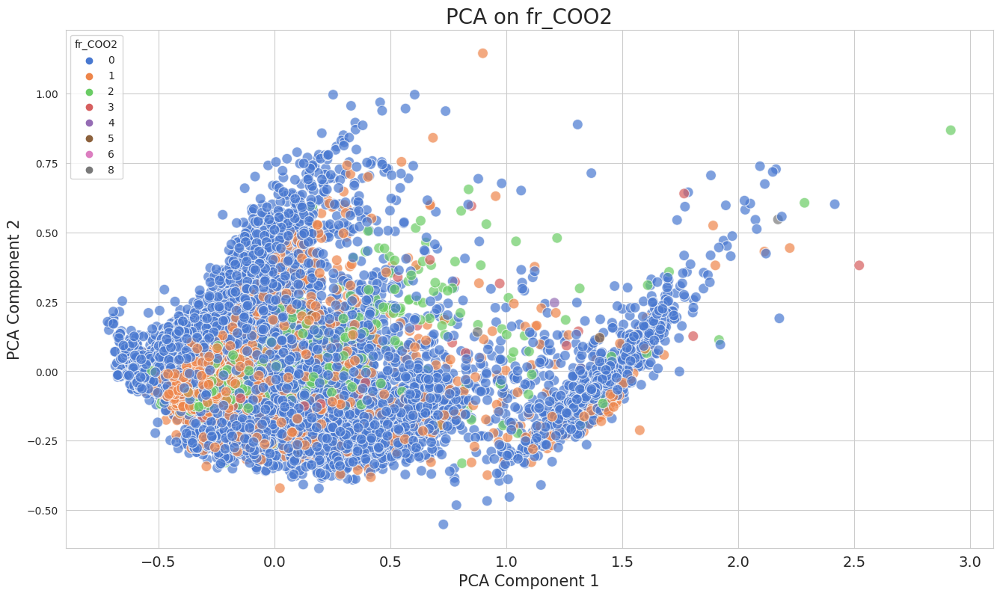

In [10]:
class Decomp:
    def __init__(self, n_components, method="pca", scaler_method='standard'):
        self.n_components = n_components
        self.method = method
        self.scaler_method = scaler_method
        
    def dimension_reduction(self, df):
            
        X_reduced = self.dimension_method(df)
        df_comp = pd.DataFrame(X_reduced, columns=[f'{self.method.upper()}_{_}' for _ in range(self.n_components)], index=df.index)
        return df_comp
    
    def dimension_method(self, df):
        
        X = self.scaler(df)
        if self.method == "pca":
            pca = PCA(n_components=self.n_components, random_state=0)
            X_reduced = pca.fit_transform(X)
            self.comp = pca
        elif self.method == "nmf":
            nmf = NMF(n_components=self.n_components, random_state=0)
            X_reduced = nmf.fit_transform(X)
        elif self.method == "umap":
            comp = UMAP(n_components=self.n_components, random_state=0)
            X_reduced = comp.fit_transform(X)
        elif self.method == "ica":
            comp = FastICA(n_components=self.n_components, whiten='unit-variance', random_state=0)
            X_reduced = comp.fit_transform(X)
        else:
            raise ValueError(f"Invalid method name: {method}")
        
        return X_reduced
    
    def scaler(self, df):
        
        _df = df.copy()
            
        if self.scaler_method == "standard":
            return StandardScaler().fit_transform(_df)
        elif self.scaler_method == "minmax":
            return MinMaxScaler().fit_transform(_df)
        elif self.scaler_method == None:
            return _df.values
        else:
            raise ValueError(f"Invalid scaler_method name")
        
    def get_columns(self):
        return [f'{self.method.upper()}_{_}' for _ in range(self.n_components)]
    
    def get_explained_variance_ratio(self):
        return np.sum(self.comp.explained_variance_ratio_)
    
    def transform(self, df):
        X = self.scaler(df)
        X_reduced = self.comp.transform(X)
        df_comp = pd.DataFrame(X_reduced, columns=[f'{self.method.upper()}_{_}' for _ in range(self.n_components)], index=df.index)
        
        return df_comp
    
    def decomp_plot(self, tmp, label, hue='genre'):
        plt.figure(figsize = (16, 9))
        sns.scatterplot(x = f"{label}_0", y = f"{label}_1", data=tmp, hue=hue, alpha=0.7, s=100, palette='muted');

        plt.title(f'{label} on {hue}', fontsize = 20)
        plt.xticks(fontsize = 14)
        plt.yticks(fontsize = 10);
        plt.xlabel(f"{label} Component 1", fontsize = 15)
        plt.ylabel(f"{label} Component 2", fontsize = 15)
    
    
data = df_train[num_cols].copy()
method = 'pca'
for target_col in target_cols:
    decomp = Decomp(n_components=2, method=method, scaler_method='minmax')
    decomp_feature = decomp.dimension_reduction(data)
    decomp_feature = pd.concat([df_train[target_col], decomp_feature], axis=1)
    decomp.decomp_plot(decomp_feature, method.upper(), target_col)
    
data = df_train[[_ for _ in num_cols if _ not in ['fr_COO', 'fr_COO2']]].copy()
method = 'pca'
for target_col in ['fr_COO', 'fr_COO2']:
    decomp = Decomp(n_components=2, method=method, scaler_method='minmax')
    decomp_feature = decomp.dimension_reduction(data)
    decomp_feature = pd.concat([df_train[target_col], decomp_feature], axis=1)
    decomp.decomp_plot(decomp_feature, method.upper(), target_col)    

del data

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Feature Engineering</p>

- `create_features()` : Create new features.
- `add_decomp_features()` : Add NMF results as features.
- `cat_encoder()` : select Label Encoder or Count Encoder or OneHot Encoder
- `AggFeatureExtractor`: Create Aggregate Feature
- **This time, instead of multi-class classification, try to solve the problem with 2-class classification, targeting EC1 and EC2 respectively.**  
- **Creating and predicting meta-features for EC1 and EC2 will also be verified in the near term.**

**Note: Not all of the above feature engineering is adapted in this kernel. Please take it as an idea.**

In [11]:
def create_features(df):
    
    new_features = {
        'BertzCT_MaxAbsEStateIndex_Ratio': df['BertzCT'] / (df['MaxAbsEStateIndex'] + 1e-12),
        'BertzCT_ExactMolWt_Product': df['BertzCT'] * df['ExactMolWt'],
        'NumHeteroatoms_FpDensityMorgan1_Ratio': df['NumHeteroatoms'] / (df['FpDensityMorgan1'] + 1e-12),
        'VSA_EState9_EState_VSA1_Ratio': df['VSA_EState9'] / (df['EState_VSA1'] + 1e-12),
        'PEOE_VSA10_SMR_VSA5_Ratio': df['PEOE_VSA10'] / (df['SMR_VSA5'] + 1e-12),
        'Chi1v_ExactMolWt_Product': df['Chi1v'] * df['ExactMolWt'],
        'Chi2v_ExactMolWt_Product': df['Chi2v'] * df['ExactMolWt'],
        'Chi3v_ExactMolWt_Product': df['Chi3v'] * df['ExactMolWt'],
        'EState_VSA1_NumHeteroatoms_Product': df['EState_VSA1'] * df['NumHeteroatoms'],
        'PEOE_VSA10_Chi1_Ratio': df['PEOE_VSA10'] / (df['Chi1'] + 1e-12),
        'MaxAbsEStateIndex_NumHeteroatoms_Ratio': df['MaxAbsEStateIndex'] / (df['NumHeteroatoms'] + 1e-12),
        'BertzCT_Chi1_Ratio': df['BertzCT'] / (df['Chi1'] + 1e-12),
    }
    
    df = df.assign(**new_features)
    new_cols = list(new_features.keys())
    
    return df, new_cols

def add_decomp_features(X_train, X_test, n_components=5):    
    
    # Select the columns
    pca_features = X_train.select_dtypes(include=['float64']).columns.tolist()
    n_components = len(pca_features) if n_components == 'all' else n_components

    # Create the pipeline
    pipeline = make_pipeline(MinMaxScaler(), NMF(n_components=n_components))
    
    # Perform
    pipeline.fit(X_train[pca_features])

    # Create column names
    pca_columns = [f'NMF_{i}' for i in range(n_components)]

    # Add PCA features to the dataframe
    X_train[pca_columns] = pipeline.transform(X_train[pca_features])
    X_test[pca_columns] = pipeline.transform(X_test[pca_features])

    return X_train, X_test

class MyCategoryEncoders():
    
    def __init__(self, cat_cols, encode='label'):
        self.cat_cols = cat_cols
        self.encode = encode
        
    def cat_encoder(self, X_train, X_test):
        if self.encode == 'label':
            ## Label Encoder
            encoder = OrdinalEncoder(cols=self.cat_cols)
            train_encoder = encoder.fit_transform(X_train[self.cat_cols]).astype(int)
            test_encoder = encoder.transform(X_test[self.cat_cols]).astype(int)
            X_train[self.cat_cols] = train_encoder[self.cat_cols]
            X_test[self.cat_cols] = test_encoder[self.cat_cols]
            encoder_cols = self.cat_cols
        elif self.encode == 'count':
            ## Count Encoder
            encoder = CountEncoder(cols=self.cat_cols)
            train_encoder = encoder.fit_transform(X_train[self.cat_cols]).astype(int).add_suffix('_count')
            test_encoder = encoder.transform(X_test[self.cat_cols]).astype(int).add_suffix('_count')
            X_train = pd.concat([X_train, train_encoder], axis=1)
            X_test = pd.concat([X_test, test_encoder], axis=1)
            encoder_cols = list(train_encoder.columns)
        else:
            ## OneHot Encoder
            encoder = OneHotEncoder(handle_unknown='ignore')
            train_encoder = encoder.fit_transform(X_train[self.cat_cols]).astype(int)
            test_encoder = encoder.transform(X_test[self.cat_cols]).astype(int)
            X_train = pd.concat([X_train, train_encoder], axis=1)
            X_test = pd.concat([X_test, test_encoder], axis=1)
            X_train.drop(self.cat_cols, axis=1, inplace=True)
            X_test.drop(self.cat_cols, axis=1, inplace=True)
            encoder_cols = list(train_encoder.columns)

        return X_train, X_test, encoder_cols

class AggFeatureExtractor(BaseEstimator, TransformerMixin):
    
    def __init__(self, group_col, agg_col, agg_func):
        self.group_col = group_col
        self.group_col_name = ''
        for col in group_col:
            self.group_col_name += col
        self.agg_col = agg_col
        self.agg_func = agg_func
        self.agg_df = None
        self.medians = None
        
    def fit(self, X, y=None):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        
        self.agg_df = X.groupby(group_col)[agg_col].agg(agg_func)
        self.agg_df.columns = [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]
        self.medians = X[agg_col].median()
        
        return self
    
    def transform(self, X):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        agg_df = self.agg_df
        medians = self.medians
        
        X_merged = pd.merge(X, agg_df, left_on=group_col, right_index=True, how='left')
        X_merged.fillna(medians, inplace=True)
        X_agg = X_merged.loc[:, [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]]
        
        return X_agg
    
    def fit_transform(self, X, y=None):
        self.fit(X, y)
        X_agg = self.transform(X)
        return X_agg

In [12]:
y_trains = []
X_trains = []
X_tests = []

# Define Categorical Features
cat_cols = ['fr_COO'] # 'fr_COO2'
num_cols = list(set(num_cols) - set(cat_cols))

# Concatenate train and original dataframes, and prepare train and test sets
train = pd.concat([df_train, original]).drop_duplicates()
test = df_test.copy()

for target_col in target_cols:
    print(f'--{target_col}--')
    
    X_train = train.drop(binary_cols+target_cols, axis=1).reset_index(drop=True)
    y_train = train[f'{target_col}'].reset_index(drop=True).astype(int)
    X_test = test.reset_index(drop=True)
    
    # ------------------
    # Create combination Features
    # ------------------
    X_train, _ = create_features(X_train)
    X_test, _ = create_features(X_test)
    
    # ------------------
    # Create Decomposion Features
    # ------------------
    # if target_col == 'EC2':
    #     X_train, X_test = add_decomp_features(X_train, X_test)
    
    # ------------------
    # Categorical encoder
    # ------------------
    # ce = MyCategoryEncoders(cat_cols, encode='count')
    # X_train, X_test, _ = ce.cat_encoder(X_train, X_test)
    
    # ------------------
    # Aggregate Features
    # ------------------
    group_cols = [
        ['EState_VSA2'], ['HallKierAlpha'], ['NumHeteroatoms'], 
        ['PEOE_VSA10'], ['PEOE_VSA14'], ['PEOE_VSA6'], ['PEOE_VSA7'], ['PEOE_VSA8'],
        ['SMR_VSA10'], ['SMR_VSA5'], ['SlogP_VSA3'], ['fr_COO'], #['fr_COO2'],
    ]
    agg_col = [
        'BertzCT',
        'Chi1', 
        'Chi1n', 
        'Chi1v', 
        'Chi2n', 
        'Chi2v', 
        'Chi3v', 
#         'Chi4n',
        'EState_VSA1', 
        'ExactMolWt', 
        'FpDensityMorgan1', 
        'FpDensityMorgan2', 
        'FpDensityMorgan3',
        'HeavyAtomMolWt', 
#         'Kappa3', 
        'MaxAbsEStateIndex', 
        'MinEStateIndex', 
        'VSA_EState9'
    ]
    agg_train, agg_test = [], []
    for group_col in group_cols:
        agg_extractor = AggFeatureExtractor(group_col=group_col, agg_col=agg_col, agg_func=['mean', 'std'])
        agg_extractor.fit(pd.concat([X_train, X_test], axis=0))
        agg_train.append(agg_extractor.transform(X_train))
        agg_test.append(agg_extractor.transform(X_test))
    X_train = pd.concat([X_train] + agg_train, axis=1).fillna(0)
    X_test = pd.concat([X_test] + agg_test, axis=1).fillna(0)
    
    # ------------------
    # StandardScaler
    # ------------------
    # sc = StandardScaler() # MinMaxScaler or StandardScaler
    # X_train[num_cols+new_cols1+new_cols2] = sc.fit_transform(X_train[num_cols+new_cols1+new_cols2])
    # X_test[num_cols+new_cols1+new_cols2] = sc.transform(X_test[num_cols+new_cols1+new_cols2])
    
    # ------------------
    # Drop Features
    # Highly correlated 
    # ['ExactMolWt', 'FpDensityMorgan1', 'FpDensityMorgan2', 'fr_COO']
    # ['FpDensityMorgan2', 'FpDensityMorgan3', 'HeavyAtomMolWt', 'fr_COO2']
    # ------------------
    drop_cols = ['is_generated', 'fr_COO2']
    X_train = X_train.drop(drop_cols, axis=1) # +[drop_target_col]
    X_test = X_test.drop(drop_cols, axis=1)
    
    print(f"X_train shape :{X_train.shape} , y_train shape :{y_train.shape}")
    print(f"X_test shape :{X_test.shape}")
    print(f"X_train ->  isnull :{X_train.isnull().values.sum()}", f", isinf :{np.isinf(X_train).values.sum()}")
    print(f"X_test -> isnull :{X_test.isnull().values.sum()}", f", isinf :{np.isinf(X_train).values.sum()}")
    display(X_train.head(3))
    
    # Store Train and Test Data
    X_trains.append(X_train)
    y_trains.append(y_train)
    X_tests.append(X_test)

del train, test, df_train, df_test, agg_train, agg_test

--EC1--

X_train shape :(15841, 426) , y_train shape :(15841,)

X_test shape :(9893, 426)

X_train ->  isnull :0 , isinf :0

X_test -> isnull :0 , isinf :0


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,...,fr_COO_mean_FpDensityMorgan3,fr_COO_std_FpDensityMorgan3,fr_COO_mean_HeavyAtomMolWt,fr_COO_std_HeavyAtomMolWt,fr_COO_mean_MaxAbsEStateIndex,fr_COO_std_MaxAbsEStateIndex,fr_COO_mean_MinEStateIndex,fr_COO_std_MinEStateIndex,fr_COO_mean_VSA_EState9,fr_COO_std_VSA_EState9
0,323.390782,9.879918,5.875576,5.875576,4.304757,4.304757,2.754513,1.749203,0.000000,11.938294,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942
1,273.723798,7.259037,4.441467,5.834958,3.285046,4.485235,2.201375,1.289775,45.135471,0.000000,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942
2,521.643822,10.911303,8.527859,11.050864,6.665291,9.519706,5.824822,1.770579,15.645394,6.606882,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942


--EC2--

X_train shape :(15841, 426) , y_train shape :(15841,)

X_test shape :(9893, 426)

X_train ->  isnull :0 , isinf :0

X_test -> isnull :0 , isinf :0


,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,...,fr_COO_mean_FpDensityMorgan3,fr_COO_std_FpDensityMorgan3,fr_COO_mean_HeavyAtomMolWt,fr_COO_std_HeavyAtomMolWt,fr_COO_mean_MaxAbsEStateIndex,fr_COO_std_MaxAbsEStateIndex,fr_COO_mean_MinEStateIndex,fr_COO_std_MinEStateIndex,fr_COO_mean_VSA_EState9,fr_COO_std_VSA_EState9
0,323.390782,9.879918,5.875576,5.875576,4.304757,4.304757,2.754513,1.749203,0.000000,11.938294,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942
1,273.723798,7.259037,4.441467,5.834958,3.285046,4.485235,2.201375,1.289775,45.135471,0.000000,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942
2,521.643822,10.911303,8.527859,11.050864,6.665291,9.519706,5.824822,1.770579,15.645394,6.606882,...,2.209732,7.433743,321.608036,232.896703,10.602613,1.872492,-2.40764,2.374573,53.145372,32.233942


## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Data Splitting</p>

In [13]:
class Splitter:
    def __init__(self, kfold=True, n_splits=5, cat_df=pd.DataFrame(), test_size=0.5):
        self.n_splits = n_splits
        self.kfold = kfold
        self.cat_df = cat_df
        self.test_size = test_size

    def split_data(self, X, y, random_state_list):
        if self.kfold == 'skf':
            for random_state in random_state_list:
                kf = StratifiedKFold(n_splits=self.n_splits, random_state=random_state, shuffle=True)
                for train_index, val_index in kf.split(X, self.cat_df):
                    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
                    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
                    yield X_train, X_val, y_train, y_val, val_index
        elif self.kfold:
            for random_state in random_state_list:
                kf = KFold(n_splits=self.n_splits, random_state=random_state, shuffle=True)
                for train_index, val_index in kf.split(X, y):
                    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
                    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
                    yield X_train, X_val, y_train, y_val, val_index
        else:
            for random_state in random_state_list:
                X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=self.test_size, random_state=random_state)
                yield X_train, X_val, y_train, y_val

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Define Model</p>
LightGBM, CatBoost Xgboost and HistGradientBoosting hyper parameters are determined by optuna.

In [14]:
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier

In [15]:
class Classifier:
    def __init__(self, target_col, n_estimators=100, device="cpu", random_state=0):
        self.n_estimators = n_estimators
        self.device = device
        self.random_state = random_state
        self.models = self._define_model(target_col)
        self.models_name = list(self._define_model(target_col).keys())
        self.len_models = len(self.models)
        
    def _define_model(self, target_col):
        
        if target_col == 'EC1':
            xgb1_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.00764887595631511,
                'booster': 'gbtree',
                'lambda': 0.0379675844718388,
                'alpha': 0.0127846822376181,
                'subsample': 0.954836600053134,
                'colsample_bytree': 0.303279712350842,
                'max_depth': 9,
                'min_child_weight': 8,
                'eta': 7.78550117314348E-07,
                'gamma': 2.16524511622072E-06,
                'grow_policy': 'lossguide',
                'n_jobs': -1,
                'objective': 'binary:logistic',
                'eval_metric': 'auc',
                'verbosity': 0,
                'random_state': self.random_state,
            }
            xgb2_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.00610113589892878,
                'booster': 'gbtree',
                'lambda': 8.96906460616343E-08,
                'alpha': 0.179699301214927,
                'subsample': 0.693147524348261,
                'colsample_bytree': 0.201796295242956,
                'max_depth': 7,
                'min_child_weight': 7,
                'eta': 0.491486337405877,
                'gamma': 0.0219744528297816,
                'grow_policy': 'lossguide',
                'n_jobs': -1,
                'objective': 'binary:logistic',
                'eval_metric': 'auc',
                'verbosity': 0,
                'random_state': self.random_state,
            }
        elif target_col == 'EC2':
            xgb1_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.0258060514910791,
                'booster': 'gbtree',
                'lambda': 7.46721185757775E-06,
                'alpha': 2.76013165565544E-08,
                'subsample': 0.20132629296478,
                'colsample_bytree': 0.45781987213833,
                'max_depth': 5,
                'min_child_weight': 5,
                'eta': 3.9844926835765E-07,
                'gamma': 0.0000620888806796158,
                'grow_policy': 'depthwise',
                'n_jobs': -1,
                'objective': 'binary:logistic',
                'eval_metric': 'auc',
                'verbosity': 0,
                'random_state': self.random_state,
            }
            xgb2_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.03045801481188,
                'booster': 'gbtree',
                'lambda': 0.141226751984267,
                'alpha': 0.0000169212384166775,
                'subsample': 0.354547691277393,
                'colsample_bytree': 0.741230587323123,
                'max_depth': 3,
                'min_child_weight': 8,
                'eta': 0.000200365560443557,
                'gamma': 0.000793115073634548,
                'grow_policy': 'depthwise',
                'n_jobs': -1,
                'objective': 'binary:logistic',
                'eval_metric': 'auc',
                'verbosity': 0,
                'random_state': self.random_state,
            }
        if self.device == 'gpu':
            xgb1_params['tree_method'] = 'gpu_hist'
            xgb1_params['predictor'] = 'gpu_predictor'
            xgb2_params['tree_method'] = 'gpu_hist'
            xgb2_params['predictor'] = 'gpu_predictor'
        
        if target_col == 'EC1':
            lgb1_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.0228011747280739,
                'reg_alpha': 5.65344226754958E-08,
                'reg_lambda': 0.0000457329103646115,
                'num_leaves': 41,
                'colsample_bytree': 0.44294848432797,
                'subsample': 0.751451025433351,
                'subsample_freq': 4,
                'min_child_samples': 47,
                'objective': 'binary',
                'metric': 'auc', # binary_error
                'boosting_type': 'gbdt',
                #'is_unbalance':True,
                # 'n_jobs': -1,
                #'force_row_wise': True,
                'device': self.device,
                'random_state': self.random_state
            }
            lgb2_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.0150317388979459,
                'reg_alpha': 0.000137387220669803,
                'reg_lambda': 0.0465956586731766,
                'num_leaves': 122,
                'colsample_bytree': 0.577212162074888,
                'subsample': 0.414797294649733,
                'subsample_freq': 2,
                'min_child_samples': 89,
                'objective': 'binary',
                'metric': 'auc', # binary_error
                'boosting_type': 'gbdt',
                #'is_unbalance':True,
                # 'n_jobs': -1,
                #'force_row_wise': True,
                'device': self.device,
                'random_state': self.random_state
            }
        elif target_col == 'EC2':
            lgb1_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.00235571575065482,
                'reg_alpha': 0.0000155412959959893,
                'reg_lambda': 0.0000347193406478947,
                'num_leaves': 131,
                'colsample_bytree': 0.468735996560667,
                'subsample': 0.428043349939151,
                'subsample_freq': 7,
                'min_child_samples': 14,
                'objective': 'binary',
                'metric': 'auc', # binary_error
                'boosting_type': 'gbdt',
                #'is_unbalance':True,
                # 'n_jobs': -1,
                #'force_row_wise': True,
                'device': self.device,
                'random_state': self.random_state
            }
            lgb2_params = {
                'n_estimators': self.n_estimators,
                'learning_rate': 0.0342188703436379,
                'reg_alpha': 2.39175347967819,
                'reg_lambda': 0.139145028543823,
                'num_leaves': 22,
                'colsample_bytree': 0.607700187719924,
                'subsample': 0.608258988150217,
                'subsample_freq': 2,
                'min_child_samples': 35,
                'objective': 'binary',
                'metric': 'auc', # binary_error
                'boosting_type': 'gbdt',
                #'is_unbalance':True,
                # 'n_jobs': -1,
                #'force_row_wise': True,
                'device': self.device,
                'random_state': self.random_state
            }
        if target_col == 'EC1':
            cat1_params = {
                'iterations': self.n_estimators,
                'depth': 3,
                'learning_rate': 0.020258010893459,
                'l2_leaf_reg': 0.583685138705941,
                'random_strength': 0.177768021213223,
                'od_type': "Iter", 
                'od_wait': 116,
                'bootstrap_type': "Bayesian",
                'grow_policy': 'Depthwise',
                'bagging_temperature': 0.478048798393903,
                'eval_metric': 'AUC', # AUC
                'loss_function': 'Logloss',
                #'auto_class_weights': 'Balanced',
                'task_type': self.device.upper(),
                'verbose': False,
                'allow_writing_files': False,
                'random_state': self.random_state
            }
            cat2_params = {
                'iterations': self.n_estimators,
                'depth': 4,
                'learning_rate': 0.0533074594005429,
                'l2_leaf_reg': 4.33121673696473,
                'random_strength': 0.00420305570017096,
                'od_type': "IncToDec", 
                'od_wait': 41,
                'bootstrap_type': "Bayesian",
                'grow_policy': 'Lossguide',
                'bagging_temperature': 9.20357081888618,
                'eval_metric': 'AUC', # AUC
                'loss_function': 'Logloss',
                #'auto_class_weights': 'Balanced',
                'task_type': self.device.upper(),
                'verbose': False,
                'allow_writing_files': False,
                'random_state': self.random_state
            }
        elif target_col == 'EC2':
            cat1_params = {
                'iterations': self.n_estimators,
                'depth': 4,
                'learning_rate': 0.0533074594005429,
                'l2_leaf_reg': 4.33121673696473,
                'random_strength': 0.00420305570017096,
                'od_type': "IncToDec", 
                'od_wait': 41,
                'bootstrap_type': "Bayesian",
                'grow_policy': 'Lossguide',
                'bagging_temperature': 9.20357081888618,
                'eval_metric': 'AUC', # AUC
                'loss_function': 'Logloss',
                #'auto_class_weights': 'Balanced',
                'task_type': self.device.upper(),
                'verbose': False,
                'allow_writing_files': False,
                'random_state': self.random_state
            }
            cat2_params = {
                'iterations': self.n_estimators,
                'depth': 5,
                'learning_rate': 0.0991887029880458,
                'l2_leaf_reg': 3.42589726767107,
                'random_strength': 0.143663354460193,
                'od_type': "Iter", 
                'od_wait': 134,
                'bootstrap_type': "Bayesian",
                'grow_policy': 'Lossguide',
                'bagging_temperature': 9.03599121747771,
                'eval_metric': 'AUC', # AUC
                'loss_function': 'Logloss',
                #'auto_class_weights': 'Balanced',
                'task_type': self.device.upper(),
                'verbose': False,
                'allow_writing_files': False,
                'random_state': self.random_state
            }
        
        if target_col == 'EC1':
            hist_params = {
                'l2_regularization': 0.654926989031482,
                'learning_rate': 0.0366207257406611,
                'max_iter': self.n_estimators,
                'max_depth': 30,
                'max_bins': 255,
                'min_samples_leaf': 52,
                'max_leaf_nodes':12,
                'early_stopping': True,
                'n_iter_no_change': 50,
                'categorical_features': cat_cols,
                #'class_weight':'balanced',
                'random_state': self.random_state
            }
        elif target_col == 'EC2':
            hist_params = {
                'l2_regularization': 0.0769190915635041,
                'learning_rate': 0.0560046631920058,
                'max_iter': self.n_estimators,
                'max_depth': 30,
                'max_bins': 255,
                'min_samples_leaf': 30,
                'max_leaf_nodes':10,
                'early_stopping': True,
                'n_iter_no_change': 50,
                'categorical_features': cat_cols,
                #'class_weight':'balanced',
                'random_state': self.random_state
            }
                    
        mlp_params = {
            'max_iter': 800,
            'early_stopping': True,
            'n_iter_no_change': 50,
            'random_state': self.random_state,
        }
        
        if target_col == 'EC1':
            models = {
                "xgb": xgb.XGBClassifier(**xgb1_params),
                "lgb": lgb.LGBMClassifier(**lgb1_params),
                "cat": CatBoostClassifier(**cat1_params),
#                 "xgb2": xgb.XGBClassifier(**xgb2_params),
                "lgb2": lgb.LGBMClassifier(**lgb2_params),
#                 "cat2": CatBoostClassifier(**cat2_params),
                'hgb': HistGradientBoostingClassifier(**hist_params),
                'rfc': BaggingClassifier(RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=self.random_state), random_state=self.random_state),
                'lrc': make_pipeline(StandardScaler(), BaggingClassifier(LogisticRegression(max_iter=500, random_state=self.random_state),random_state=self.random_state)),
#                 'etc': ExtraTreesClassifier(n_estimators=800, n_jobs=-1, random_state=self.random_state),
                'mlp': make_pipeline(StandardScaler(), MLPClassifier(**mlp_params, hidden_layer_sizes=(100,))),
                'ada': AdaBoostClassifier(n_estimators=100, random_state=self.random_state)
                #'knn': KNeighborsClassifier(n_neighbors=15, n_jobs=-1),
                #'gbc': GradientBoostingClassifier(n_estimators=500, random_state=self.random_state)
                #'svc': SVC(max_iter=-1, kernel="rbf", gamma="auto", probability=True, random_state=self.random_state),
            }
        elif target_col == 'EC2':
            models = {
                "xgb": xgb.XGBClassifier(**xgb1_params),
                "lgb": lgb.LGBMClassifier(**lgb1_params),
                "cat": CatBoostClassifier(**cat1_params),
                "xgb2": xgb.XGBClassifier(**xgb2_params),
                "lgb2": lgb.LGBMClassifier(**lgb2_params),
                "cat2": CatBoostClassifier(**cat2_params),
                'hgb':HistGradientBoostingClassifier(**hist_params),
                'rfc': BaggingClassifier(RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=self.random_state),random_state=self.random_state),
                'lrc': make_pipeline(StandardScaler(), BaggingClassifier(LogisticRegression(max_iter=500, random_state=self.random_state),random_state=self.random_state)),
                'etc': BaggingClassifier(ExtraTreesClassifier(n_estimators=800, n_jobs=-1, random_state=self.random_state),random_state=self.random_state),
                'mlp': make_pipeline(StandardScaler(), MLPClassifier(**mlp_params, hidden_layer_sizes=(100,))),
                'ada': AdaBoostClassifier(n_estimators=100, random_state=self.random_state)
                #'knn': KNeighborsClassifier(n_neighbors=15, n_jobs=-1),
                #'gbc': GradientBoostingClassifier(n_estimators=500, random_state=self.random_state)
                #'svc': SVC(max_iter=-1, kernel="rbf", gamma="auto", probability=True, random_state=self.random_state),
            }
        
        return models

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Feature Selection (RFE-CV)</p>
RFECV is a technique for automated feature selection that combines recursive feature elimination and cross-validation to identify the optimal subset of features for a given machine learning task.

**Note: RFE-CV takes a lot of time. Here n_estimators are reduced to save time. When originally used, it is recommended to run with the actual hyperparameters.**

![](https://www.researchgate.net/publication/362548828/figure/fig4/AS:11431281087244666@1664503792971/Recursive-Feature-Elimination-with-Cross-ValidationRFECV-flowchart-model-diagram.png)

Reference: Feature fusion based machine learning pipeline to improve breast cancer prediction, 81, p.37627–37655 (2022) https://doi.org/10.1007/s11042-022-13498-4

In [16]:
def plot_recursive_feature_elimination(elimination, scoring, min_features_to_select, name):
    n_scores = len(elimination.cv_results_["mean_test_score"])
    plt.figure(figsize=(10, 4))
    plt.xlabel("Number of features selected")
    plt.ylabel(f"{scoring}")

    # Plot the mean test scores with error bars
    plt.errorbar(
        range(min_features_to_select, n_scores + min_features_to_select),
        elimination.cv_results_["mean_test_score"],
        yerr=elimination.cv_results_["std_test_score"],
        fmt='o-',
        capsize=3,
        markersize=4,
    )

    plt.title(f"{name} Recursive Feature Elimination with correlated features", fontweight='bold')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

--EC1--

xgb  Best Mean roc_auc 0.71553 ± 0.00474 | N_STEP 0

Best unnecessary_feature: ['PEOE_VSA6_std_Chi2n', 'PEOE_VSA6_mean_Chi2v', 'PEOE_VSA6_std_MinEStateIndex', 'fr_COO_mean_VSA_EState9', 'fr_COO_std_VSA_EState9']

Removed features: ['fr_COO_std_VSA_EState9', 'PEOE_VSA6_mean_Chi2v', 'PEOE_VSA6_std_Chi2n', 'fr_COO_mean_VSA_EState9', 'PEOE_VSA6_std_MinEStateIndex']

------------------------------------------------------------

lgb  Best Mean roc_auc 0.71759 ± 0.00502 | N_STEP 1

Best unnecessary_feature: ['PEOE_VSA6_std_Chi2n', 'PEOE_VSA6_mean_Chi2v', 'fr_COO_mean_VSA_EState9', 'fr_COO_std_VSA_EState9']

Removed features: ['fr_COO_std_VSA_EState9', 'PEOE_VSA6_mean_Chi2v', 'PEOE_VSA6_std_Chi2n', 'fr_COO_mean_VSA_EState9']

------------------------------------------------------------

cat  Best Mean roc_auc 0.71597 ± 0.00731 | N_STEP 3

Best unnecessary_feature: ['BertzCT', 'PEOE_VSA6_mean_Chi2v']

Removed features: ['PEOE_VSA6_mean_Chi2v', 'BertzCT']

------------------------------

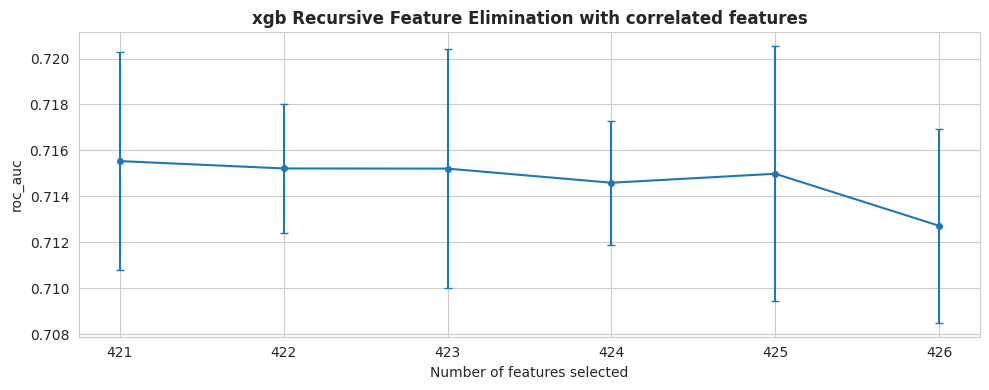

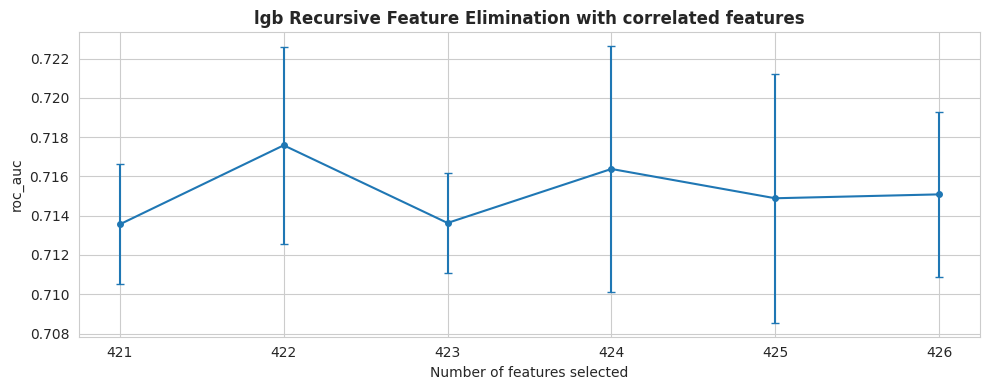

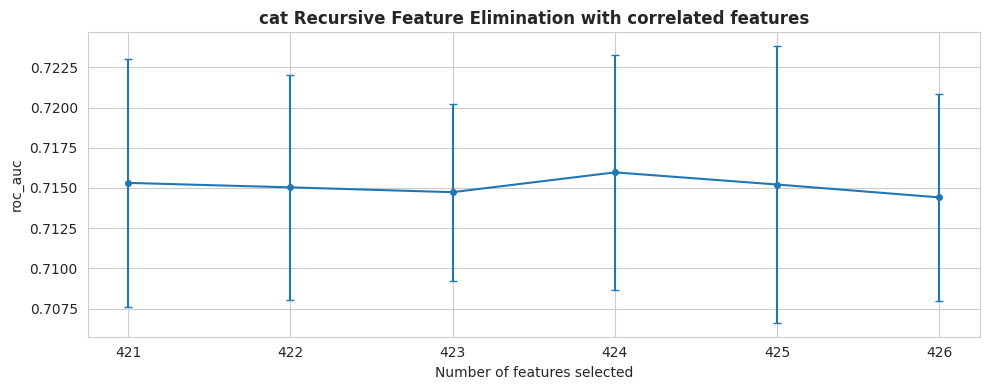

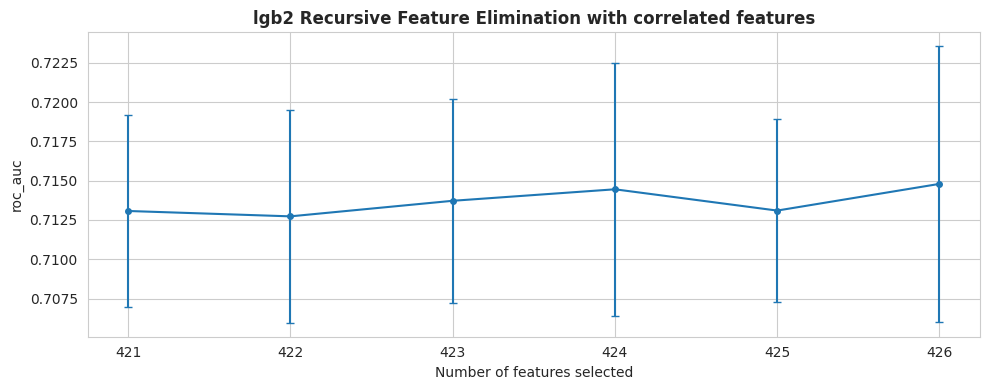

--EC2--

xgb  Best Mean roc_auc 0.55879 ± 0.00482 | N_STEP 1

Best unnecessary_feature: ['PEOE_VSA6_std_Chi2n', 'PEOE_VSA6_mean_Chi2v', 'PEOE_VSA6_std_Chi2v', 'fr_COO_std_VSA_EState9']

Removed features: ['PEOE_VSA6_mean_Chi2v', 'PEOE_VSA6_std_Chi2v', 'fr_COO_std_VSA_EState9', 'PEOE_VSA6_std_Chi2n']

------------------------------------------------------------

lgb  Best Mean roc_auc 0.56366 ± 0.01024 | N_STEP 2

Best unnecessary_feature: ['PEOE_VSA6_mean_Chi2v', 'fr_COO_mean_VSA_EState9', 'fr_COO_std_VSA_EState9']

Removed features: ['PEOE_VSA6_mean_Chi2v', 'fr_COO_std_VSA_EState9', 'fr_COO_mean_VSA_EState9']

------------------------------------------------------------

cat  Best Mean roc_auc 0.56711 ± 0.01462 | N_STEP 3

Best unnecessary_feature: ['fr_COO_mean_VSA_EState9', 'fr_COO_std_VSA_EState9']

Removed features: ['fr_COO_std_VSA_EState9', 'fr_COO_mean_VSA_EState9']

------------------------------------------------------------

xgb2  Best Mean roc_auc 0.56701 ± 0.00746 | N_STEP

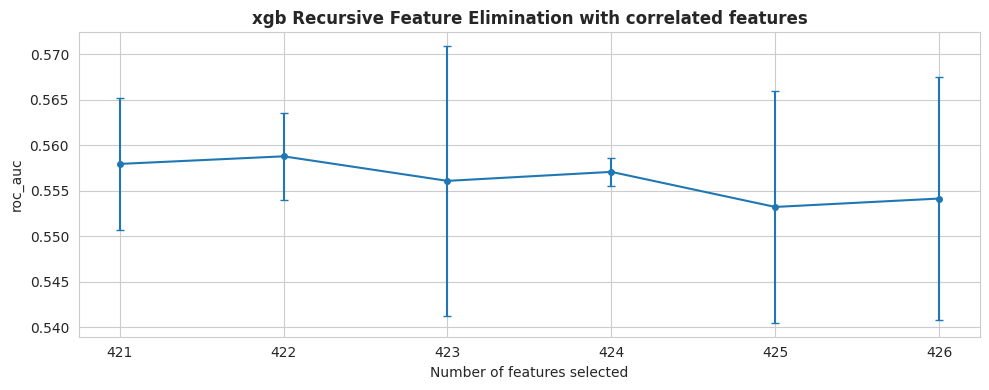

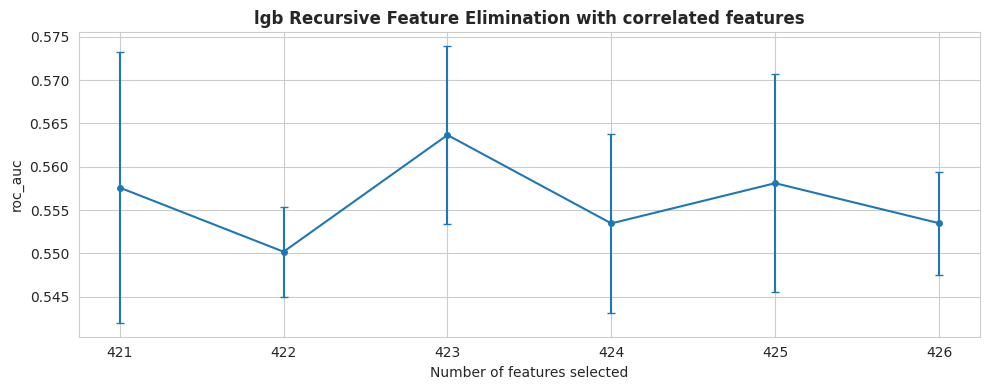

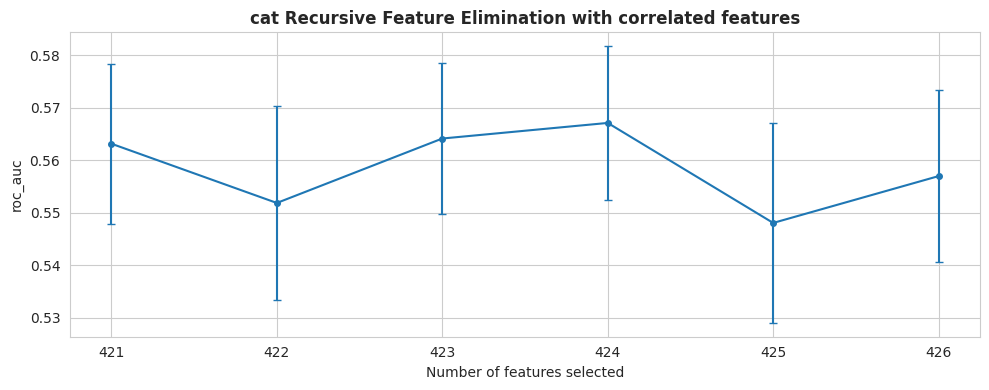

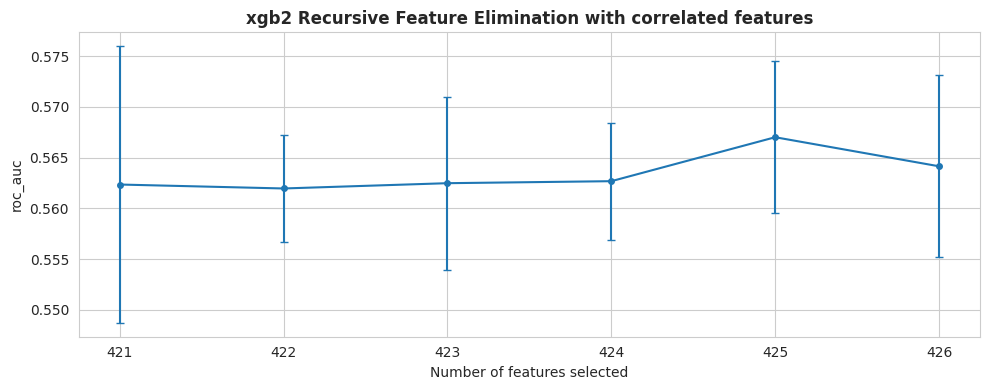

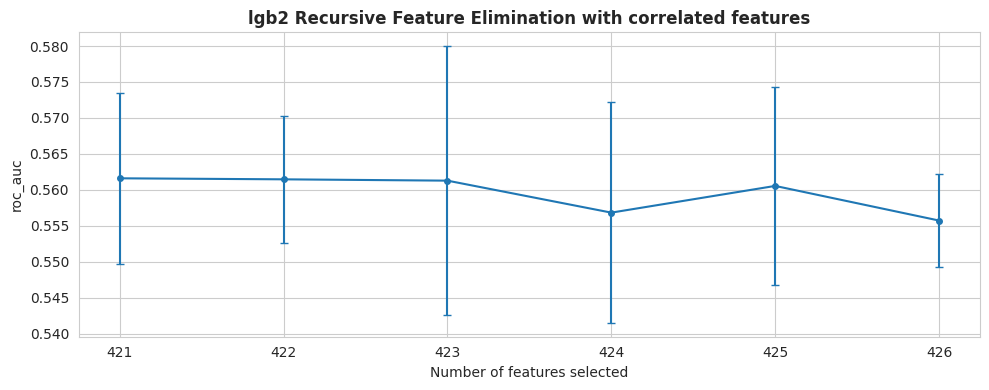

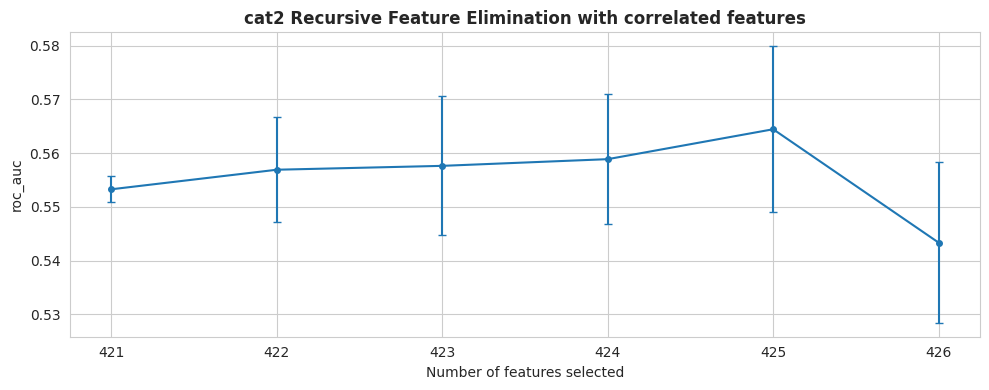

CPU times: user 2min 7s, sys: 6.26 s, total: 2min 13s

Wall time: 50 s


In [17]:
%%time

n_estimators = 50
scoring = 'roc_auc'

for target_col, X_train, y_train, X_test in zip(target_cols, X_trains, y_trains, X_tests):
    min_features_to_select = len(X_train.columns) - 5
    
    print(f'--{target_col}--')
    # drop_target_col = 'EC2' if target_col == 'EC1' else 'EC1'
    # X_train = X_train.drop(drop_target_col, axis=1)
    
    splitter = Splitter(kfold=False, test_size=0.7)
    X_train_, X_val, y_train_, y_val = next(iter(splitter.split_data(X_train, y_train, random_state_list=[42])))
    
    classifier = Classifier(target_col, n_estimators, device='cpu', random_state=0)
    models = classifier.models

    models_name = [_ for _ in classifier.models_name if ('xgb' in _) or ('lgb' in _) or ('cat' in _)]
    trained_models = dict(zip(models_name, ['' for _ in range(classifier.len_models)]))
    unnecessary_features = dict(zip(models_name, [[] for _ in range(classifier.len_models)]))
    for name, model in models.items():
        if ('xgb' in name) or ('lgb' in name) or ('cat' in name):
            elimination = RFECV(
                model, 
                step=1,
                min_features_to_select=min_features_to_select,
                cv=3,
                scoring=scoring, 
                n_jobs=-1)
            elimination.fit(X_train_, y_train_)
            unnecessary_feature = list(X_train.columns[~elimination.get_support()])
            idx = np.argmax(elimination.cv_results_['mean_test_score'])
            mean_score = elimination.cv_results_['mean_test_score'][idx]
            std_score = elimination.cv_results_['std_test_score'][idx]
            print(f'{blu}{name}{res} {red} Best Mean{res} {scoring} {red}{mean_score:.5f} ± {std_score:.5f}{res} | N_STEP {idx}')
            print(f"Best unnecessary_feature: {unnecessary_feature}")
            removed_features = [f for i, f in enumerate(X_train.columns) if elimination.support_[i] == False]
            ranked_features = sorted(zip(X_train.columns, elimination.ranking_), key=lambda x: x[1])
            removed_features_by_ranking = [f[0] for f in ranked_features if f[0] in removed_features][::-1]
            print("Removed features:", removed_features_by_ranking)
            print(f'{"-" * 60}')

            trained_models[f'{name}'] = deepcopy(elimination)
            unnecessary_features[f'{name}'].extend(unnecessary_feature)

    unnecessary_features = np.concatenate([_ for _ in unnecessary_features.values()])
    features = np.unique(unnecessary_features, return_counts=True)[0]
    counts = np.unique(unnecessary_features, return_counts=True)[1]
    drop_features = list(features[counts >= 2])
    print("Features recommended to be removed:", drop_features)
    
    for name, elimination in trained_models.items():
        plot_recursive_feature_elimination(elimination, scoring, min_features_to_select, name)

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Configuration</p>

In [18]:
# Settings
kfold = 'skf'
n_splits = 5 # 10
n_reapts = 3 # 1
random_state = 42
n_estimators = 9999 # 9999
early_stopping_rounds = 200
n_trials = 1000 # 3000
verbose = False
device = 'cpu'

# Fix seed
random.seed(random_state)
random_state_list = random.sample(range(9999), n_reapts)
# random_state_list = [42]
# n_reapts = len(random_state_list)

# metrics
def auc(y_true, y_pred):
    return roc_auc_score(y_true, y_pred)
metric = auc
metric_name = metric.__name__.upper()

# To calculate runtime
def sec_to_minsec(t):
    min_ = int(t / 60)
    sec = int(t - min_*60)
    return min_, sec

# Process


## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">One Model Xgboost</p>

The xgboost model architecture is based on the following: 
[[PS S3E14, 2023] EDA and Submission](https://www.kaggle.com/code/sergiosaharovskiy/ps-s3e14-2023-eda-and-submission)

In [19]:
def plot_training_process(lossfunc_key, eval_results_, best_iters_, early_stopping_rounds):

    metric_score_folds = pd.DataFrame.from_dict(eval_results_).T
    fit_rmsle = metric_score_folds.fit.apply(lambda x: x[lossfunc_key])
    val_rmsle = metric_score_folds.val.apply(lambda x: x[lossfunc_key])

    n_splits = len(metric_score_folds)
    n_rows = math.ceil(n_splits / 3)

    fig, axes = plt.subplots(n_rows, 3, figsize=(20, n_rows * 4), dpi=150)
    ax = axes.flatten()

    for i, (f, v, best_iter) in enumerate(zip(fit_rmsle, val_rmsle, best_iters_)): 
        sns.lineplot(f, color='#B90000', ax=ax[i], label='fit')
        sns.lineplot(v, color='#048BA8', ax=ax[i], label='val')
        ax[i].legend()
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].set_title(f'Fold {i}', fontdict={'fontweight': 'bold'})

        color = ['#048BA8', '#90A6B1']
        span_range = [[0, best_iter], [best_iter + 10, best_iter + early_stopping_rounds]]

        for idx, sub_title in enumerate([f'Best\nIteration: {best_iter}', f'Early\n Stopping: {early_stopping_rounds}']):
            ax[i].annotate(sub_title,
                           xy=(sum(span_range[idx]) / 2, 4000),
                           xytext=(0, 0),
                           textcoords='offset points',
                           va="center",
                           ha="center",
                           color="w",
                           fontsize=12,
                           fontweight='bold',
                           bbox=dict(boxstyle='round4', pad=0.4, color=color[idx], alpha=0.6))
            ax[i].axvspan(span_range[idx][0] - 0.4, span_range[idx][1] + 0.4, color=color[idx], alpha=0.07)

        ax[i].set_xlim(0, best_iter + 20 + early_stopping_rounds)
        ax[i].set_xlabel('Boosting Round', fontsize=12)
        ax[i].set_ylabel(f'{lossfunc_key}', fontsize=12)
        ax[i].legend(loc='upper right', title=lossfunc_key)

    for j in range(i+1, n_rows * 3):
        ax[j].axis('off')

    plt.tight_layout()
    plt.show()
    

def plot_feature_importance(fi):
    fi_gain = fi[[col for col in fi.columns if col.startswith('gain')]].mean(axis=1)
    fi_splt = fi[[col for col in fi.columns if col.startswith('split')]].mean(axis=1)
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 6), dpi=150)

    # Split fi.
    data_splt = fi_splt.sort_values(ascending=False)
    data_splt = data_splt.head(20)
    sns.barplot(x=data_splt.values, y=data_splt.index,
                color='#1E90FF', linewidth=0.5, edgecolor="black", ax=ax[0])
    ax[0].set_title(f'Feature Importance "Split"', fontdict={'fontweight': 'bold'})
    ax[0].set_xlabel("Importance", fontsize=12)
    ax[0].spines['right'].set_visible(False)
    ax[0].spines['top'].set_visible(False)

    # Gain fi.
    data_gain = fi_gain.sort_values(ascending=False)
    data_gain = data_gain.head(20)
    sns.barplot(x=data_gain.values, y=data_gain.index,
                color='#4169E1', linewidth=0.5, edgecolor="black", ax=ax[1])
    ax[1].set_title(f'Feature Importance "Gain"', fontdict={'fontweight': 'bold'})
    ax[1].set_xlabel("Importance", fontsize=12)
    ax[1].spines['right'].set_visible(False)
    ax[1].spines['top'].set_visible(False)

    plt.tight_layout()
    plt.show()

--EC1--

Fold:   0| AUC: 0.70323 | Best iteration:   48

Fold:   1| AUC: 0.71987 | Best iteration:  243

Fold:   2| AUC: 0.71485 | Best iteration:  323

Fold:   3| AUC: 0.71226 | Best iteration:  195

Fold:   4| AUC: 0.71304 | Best iteration:   85

**************************************************

Mean full AUC : 0.69608

Mean val AUC  : 0.71265


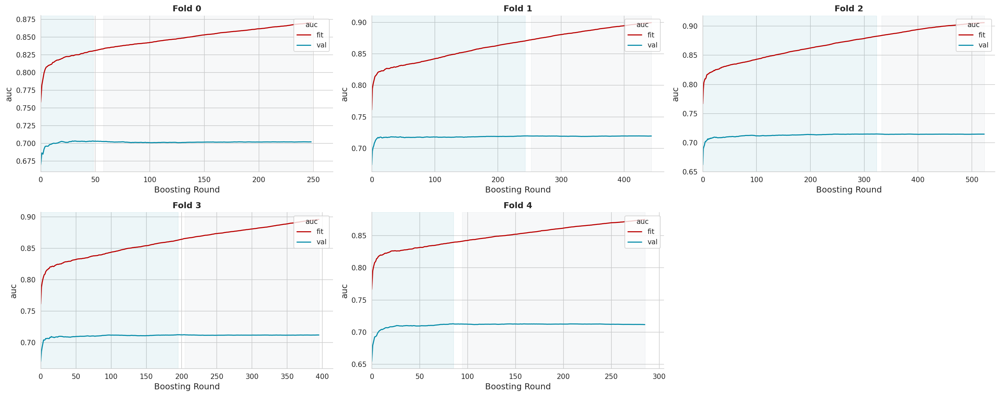

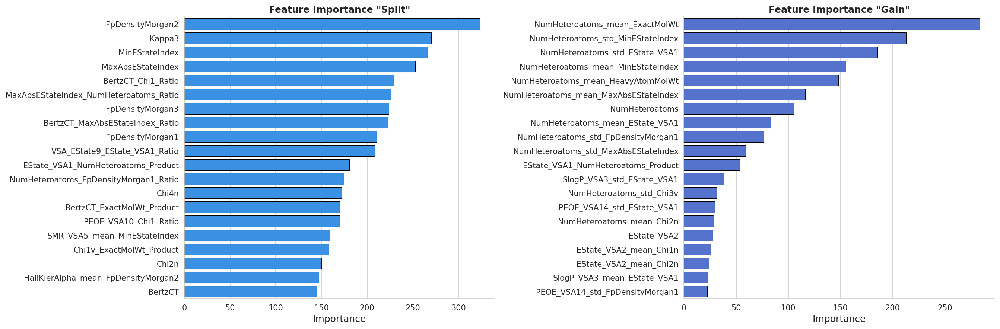

--EC2--

Fold:   0| AUC: 0.60273 | Best iteration:  187

Fold:   1| AUC: 0.62118 | Best iteration:   33

Fold:   2| AUC: 0.59723 | Best iteration:  133

Fold:   3| AUC: 0.59487 | Best iteration:   31

Fold:   4| AUC: 0.57675 | Best iteration:   34

**************************************************

Mean full AUC : 0.56603

Mean val AUC  : 0.65560


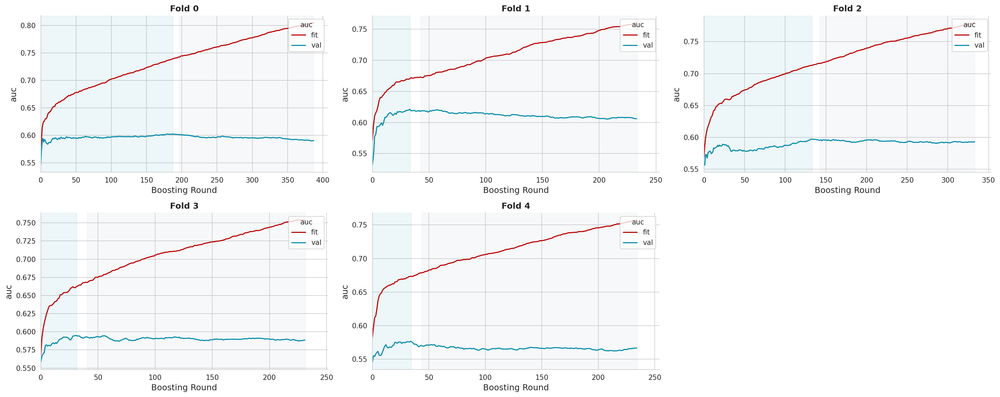

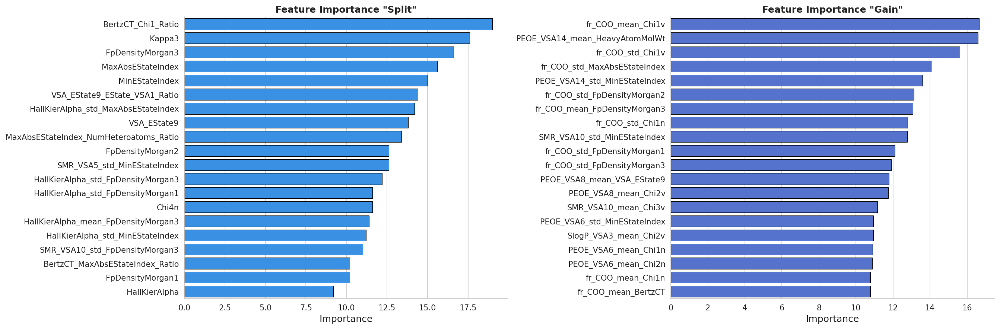

In [20]:
n_estimators_ = 600

test_preds_list = []
val_scores = []
for target_col, X_train, y_train, X_test in zip(target_cols, X_trains, y_trains, X_tests):
    print(f'--{target_col}--')
    # drop_target_col = 'EC2' if target_col == 'EC1' else 'EC1'
    # X_train = X_train.drop(drop_target_col, axis=1)

    feature_importances_ = pd.DataFrame(index=X_train.columns)
    eval_results_ = {}
    best_iters_ = []
    oof = np.zeros((X_train.shape[0]))
    test_preds = np.zeros((X_test.shape[0]))

    splitter = Splitter(kfold=kfold, n_splits=n_splits, cat_df=y_train)
    for i, (X_train_, X_val, y_train_, y_val, val_index) in enumerate(splitter.split_data(X_train, y_train, random_state_list=[0])):
        fold = i % n_splits
        m = i // n_splits

        # XGB .train() requires xgboost.DMatrix.
        # https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.DMatrix
        fit_set = xgb.DMatrix(X_train_, y_train_)
        val_set = xgb.DMatrix(X_val, y_val)
        watchlist = [(fit_set, 'fit'), (val_set, 'val')]

        # Training.
        # https://xgboost.readthedocs.io/en/stable/python/python_api.html#module-xgboost.training
        classifier = Classifier(target_col, n_estimators_, device)
        xgb_params = classifier.models['xgb'].get_params()
        # xgb_params = xgb.XGBClassifier(n_estimators=3000, learning_rate=0.01).get_params()

        eval_results_[fold] = {}
        model = xgb.train(
            num_boost_round=xgb_params['n_estimators'],
            params=xgb_params,
            dtrain=fit_set,
            evals=watchlist,
            evals_result=eval_results_[fold],
            verbose_eval=False,
            callbacks=[xgb.callback.EarlyStopping(early_stopping_rounds, data_name='val', save_best=True)])

        val_preds = model.predict(val_set)
        test_preds += model.predict(xgb.DMatrix(X_test)) / n_splits

        oof[val_index] = val_preds

        val_score = metric(y_val, val_preds)
        best_iter = model.best_iteration
        best_iters_.append(best_iter)
        val_scores.append(val_score)
        print(f'Fold: {blu}{fold:>3}{res}| {metric_name}: {blu}{val_score:.5f}{res}' f' | Best iteration: {blu}{best_iter:>4}{res}')

        # Stores the feature importances
        feature_importances_[f'gain_{fold}'] = feature_importances_.index.map(model.get_score(importance_type='gain'))
        feature_importances_[f'split_{fold}'] = feature_importances_.index.map(model.get_score(importance_type='weight'))

    # Submission
    sub = pd.read_csv(os.path.join(filepath, 'sample_submission.csv'))
    sub[f'{target_col}'] = test_preds
    sub.to_csv(f'xgb_{target_col}_submission.csv', index=False)
    test_preds_list.append(test_preds) # np.round(test_preds)
    # xgb_test_preds = test_preds.copy()

    mean_cv_score_full = metric(y_train, oof)
    print(f'{"*" * 50}\n{red}Mean full{res} {metric_name} : {red}{mean_cv_score_full:.5f}{res}')
    print(f'{red}Mean val{res} {metric_name}  : {red}{np.mean(val_scores):.5f}{res}')
    
    plot_training_process('auc', eval_results_, best_iters_, early_stopping_rounds)
    plot_feature_importance(feature_importances_)

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Weighted Ensemble Model by Optuna on Training</p>
A weighted average is performed during training;  
The weights were determined for each model using the predictions for the train data created in the out of fold with Optuna's CMAsampler. (Here it is defined by `OptunaWeights`)  
This is an extension of the averaging method. All models are assigned different weights defining the importance of each model for prediction.

![](https://www.analyticsvidhya.com/wp-content/uploads/2015/08/Screen-Shot-2015-08-22-at-6.40.37-pm.png)

In [21]:
class OptunaWeights:
    def __init__(self, random_state, n_trials=100):
        self.study = None
        self.weights = None
        self.random_state = random_state
        self.n_trials = n_trials

    def _objective(self, trial, y_true, y_preds):
        # Define the weights for the predictions from each model
        weights = [trial.suggest_float(f"weight{n}", 1e-15, 1) for n in range(len(y_preds))]

        # Calculate the weighted prediction
        weighted_pred = np.average(np.array(y_preds).T, axis=1, weights=weights)

        # Calculate the score for the weighted prediction
        score = metric(y_true, weighted_pred)
        return score

    def fit(self, y_true, y_preds):
        optuna.logging.set_verbosity(optuna.logging.ERROR)
        sampler = optuna.samplers.CmaEsSampler(seed=self.random_state)
        pruner = optuna.pruners.HyperbandPruner()
        self.study = optuna.create_study(sampler=sampler, pruner=pruner, study_name="OptunaWeights", direction='maximize')
        objective_partial = partial(self._objective, y_true=y_true, y_preds=y_preds)
        self.study.optimize(objective_partial, n_trials=self.n_trials)
        self.weights = [self.study.best_params[f"weight{n}"] for n in range(len(y_preds))]

    def predict(self, y_preds):
        assert self.weights is not None, 'OptunaWeights error, must be fitted before predict'
        weighted_pred = np.average(np.array(y_preds).T, axis=1, weights=self.weights)
        return weighted_pred

    def fit_predict(self, y_true, y_preds):
        self.fit(y_true, y_preds)
        return self.predict(y_preds)
    
    def weights(self):
        return self.weights

In [ ]:
%%time

test_predss_list = []
oof_predss_list = []
ensemble_score_list = []
weights_list = []
trained_models_list = []
score_dict_list = []
X_val_list = []
oof_preds_list = []

for target_col, X_train, y_train, X_test in zip(target_cols, X_trains, y_trains, X_tests):
    print(f'=== {target_col} ===')
    # drop_target_col = 'EC2' if target_col == 'EC1' else 'EC1'
    # X_train = X_train.drop(drop_target_col, axis=1)

    # Initialize an array for storing test predictions
    classifier = Classifier(target_col, n_estimators, device, random_state)
    test_predss = np.zeros((X_test.shape[0]))
    oof_predss = np.zeros((X_train.shape[0], n_reapts))
    ensemble_score, ensemble_score_ = [], []
    weights = []
    trained_models = dict(zip([_ for _ in classifier.models_name if ('xgb' in _) or ('lgb' in _) or ('cat' in _)], [[] for _ in range(classifier.len_models)]))
    score_dict = dict(zip(classifier.models_name, [[] for _ in range(classifier.len_models)]))

    splitter = Splitter(kfold=kfold, n_splits=n_splits, cat_df=y_train)
    for i, (X_train_, X_val, y_train_, y_val, val_index) in enumerate(splitter.split_data(X_train, y_train, random_state_list=random_state_list)):
        n = i % n_splits
        m = i // n_splits

        # Get a set of classifier models
        classifier = Classifier(target_col, n_estimators, device, random_state_list[m])
        models = classifier.models

        # Initialize lists to store oof and test predictions for each base model
        oof_preds = []
        test_preds = []

        # Loop over each base model and fit it to the training data, evaluate on validation data, and store predictions
        for name, model in models.items():
            best_iteration = None
            start_time = time.time()

            if ('xgb' in name) or ('lgb' in name) or ('cat' in name):
                early_stopping_rounds_ = int(early_stopping_rounds*2) if ('lgb' in name) else early_stopping_rounds

                if 'lgb' in name:
                    model.fit(
                        X_train_, y_train_, eval_set=[(X_val, y_val)], categorical_feature=cat_cols,
                        early_stopping_rounds=early_stopping_rounds_, verbose=verbose)
                elif 'cat' in name :
                    model.fit(
                        Pool(X_train_, y_train_, cat_features=cat_cols), eval_set=Pool(X_val, y_val, cat_features=cat_cols),
                        early_stopping_rounds=early_stopping_rounds_, verbose=verbose)
                else:
                    model.fit(X_train_, y_train_, eval_set=[(X_val, y_val)], early_stopping_rounds=early_stopping_rounds_, verbose=verbose)

                best_iteration = model.best_iteration if ('xgb' in name) else model.best_iteration_
            else:
                model.fit(X_train_, y_train_)

            end_time = time.time()
            min_, sec = sec_to_minsec(end_time - start_time)

            if name in trained_models.keys():
                trained_models[f'{name}'].append(deepcopy(model))

            y_val_pred = model.predict_proba(X_val)[:, 1].reshape(-1)
            test_pred = model.predict_proba(X_test)[:, 1].reshape(-1)

            score = metric(y_val, y_val_pred)
            score_dict[name].append(score)
            print(f'{blu}{name}{res} [FOLD-{n} SEED-{random_state_list[m]}] {metric_name} {blu}{score:.5f}{res} | Best iteration {blu}{best_iteration}{res} | Runtime {min_}min {sec}s')

            oof_preds.append(y_val_pred)
            test_preds.append(test_pred)

        # Use Optuna to find the best ensemble weights
        optweights = OptunaWeights(random_state=random_state_list[m], n_trials=n_trials)
        y_val_pred = optweights.fit_predict(y_val.values, oof_preds)

        score = metric(y_val, y_val_pred)
        print(f'{red}>>> Ensemble{res} [FOLD-{n} SEED-{random_state_list[m]}] {metric_name} {red}{score:.5f}{res}')
        print(f'{"-" * 60}')
        ensemble_score.append(score)
        weights.append(optweights.weights)

        # Predict to X_test by the best ensemble weights
        test_predss += optweights.predict(test_preds) / (n_splits * len(random_state_list))
        oof_predss[X_val.index, m] += optweights.predict(oof_preds)

        gc.collect()
        
    test_predss_list.append(test_predss)
    oof_predss_list.append(oof_predss)
    ensemble_score_list.append(ensemble_score)
    weights_list.append(weights)
    trained_models_list.append(trained_models)
    score_dict_list.append(score_dict)
    X_val_list.append(X_val)
    oof_preds_list.append(oof_preds)

=== EC1 ===

xgb [FOLD-0 SEED-1824] AUC 0.71040 | Best iteration 238 | Runtime 0min 3s

lgb [FOLD-0 SEED-1824] AUC 0.71181 | Best iteration 55 | Runtime 0min 1s

cat [FOLD-0 SEED-1824] AUC 0.71318 | Best iteration 561 | Runtime 0min 3s

lgb2 [FOLD-0 SEED-1824] AUC 0.71352 | Best iteration 136 | Runtime 0min 1s

hgb [FOLD-0 SEED-1824] AUC 0.70937 | Best iteration None | Runtime 0min 1s

rfc [FOLD-0 SEED-1824] AUC 0.70052 | Best iteration None | Runtime 0min 12s

lrc [FOLD-0 SEED-1824] AUC 0.70517 | Best iteration None | Runtime 0min 10s

mlp [FOLD-0 SEED-1824] AUC 0.70141 | Best iteration None | Runtime 0min 6s

ada [FOLD-0 SEED-1824] AUC 0.69992 | Best iteration None | Runtime 0min 9s

>>> Ensemble [FOLD-0 SEED-1824] AUC 0.71666

------------------------------------------------------------

xgb [FOLD-1 SEED-1824] AUC 0.72227 | Best iteration 410 | Runtime 0min 5s

lgb [FOLD-1 SEED-1824] AUC 0.72329 | Best iteration 59 | Runtime 0min 1s

cat [FOLD-1 SEED-1824] AUC 0.72484 | Best iterati

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Mean Scores for each model</p>

In [ ]:
def plot_score_from_dict(score_dict, title='', ascending=True):
    score_df = pd.melt(pd.DataFrame(score_dict))
    score_df = score_df.sort_values('value', ascending=ascending)
    
    plt.figure(figsize=(12, 6))
    sns.barplot(x='value', y='variable', data=score_df, palette='Blues_r', errorbar='sd')
    plt.xlabel(f'{title}', fontsize=14)
    plt.ylabel('')
    #plt.title(f'{title}', fontsize=18)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, axis='x')
    plt.show()

for target_col, score_dict in zip(target_cols, score_dict_list):
    print(f'=== {target_col} ===') 
    print(f'--- Mean {metric_name} Scores---')    
    for name, score in score_dict.items():
        mean_score = np.mean(score)
        std_score = np.std(score)
        print(f'{name}: {red}{mean_score:.5f} ± {std_score:.5f}{res}')
    plot_score_from_dict(score_dict, title=f'{metric_name} (n_splits:{n_splits})')

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Weight of the Optuna Ensemble</p>

In [ ]:
def plot_heatmap_with_dendrogram(df, title, figsize=(18, 10), fontsize=10):
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    colormap = plt.cm.RdBu_r
    fig, ax = plt.subplots(2, 1, figsize=figsize)

    # Plot heatmap
    ax[0].set_title(f'{title} Correlation of Features', fontweight='bold', y=1.02, size=15)
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0,
                square=True, cmap=colormap, linecolor='white', annot=True,
                annot_kws={"size": fontsize, "weight": "bold"}, mask=mask, ax=ax[0], cbar=False)

    # Plot dendrogram
    correlations = df.corr()
    converted_corr = 1 - np.abs(correlations)
    Z = linkage(squareform(converted_corr), 'complete')
    
    dn = dendrogram(Z, labels=df.columns, above_threshold_color='#ff0000', ax=ax[1])
    ax[1].set_title(f'{title} Hierarchical Clustering Dendrogram', fontsize=15, fontweight='bold')
    ax[1].grid(axis='x')
    ax[1].tick_params(axis='x', rotation=90)
    ax[1].tick_params(axis='y', labelsize=fontsize)

    plt.tight_layout()
    plt.show()

for target_col, ensemble_score, weights, oof_preds, score_dict in zip(target_cols, ensemble_score_list, weights_list, oof_preds_list, score_dict_list):
    print(f'=== {target_col} ===') 

    # Calculate the mean LogLoss score of the ensemble
    mean_score = np.mean(ensemble_score)
    std_score = np.std(ensemble_score)
    print(f'{red}Mean{res} Optuna Ensemble {metric_name} {red}{mean_score:.5f} ± {std_score:.5f}{res}')

    print('')
    # Print the mean and standard deviation of the ensemble weights for each model
    print('--- Optuna Weights---')
    mean_weights = np.mean(weights, axis=0)
    std_weights = np.std(weights, axis=0)
    for name, mean_weight, std_weight in zip(models.keys(), mean_weights, std_weights):
        print(f'{name}: {blu}{mean_weight:.5f} ± {std_weight:.5f}{res}')

    # Plot Optuna Weights
    normalize = [((weight - np.min(weight)) / (np.max(weight) - np.min(weight))).tolist() for weight in weights]
    weight_dict = dict(zip(list(score_dict.keys()), np.array(normalize).T.tolist()))
    plot_score_from_dict(weight_dict, title='Optuna Weights (Normalize 0 to 1)', ascending=False)
    
    # Plot oof_predict analyis for each model
    plot_heatmap_with_dendrogram(pd.DataFrame(oof_preds, index=list(score_dict.keys())).T, title='OOF Predict', figsize=(10, 10), fontsize=8)

mean_score = np.mean(ensemble_score_list)
std_score = np.std(ensemble_score_list)
print(f'{red} EC1 and EC2 Mean{res} Optuna Ensemble {metric_name} {red}{mean_score:.5f} ± {std_score:.5f}{res}')

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">SHAP Analysis</p>
SHAP stands for SHapley Additive exPlanations, a method for determining the contribution of each variable (feature) to the model's predicted outcome. Since SHAP cannot be adapted for ensemble models, let's use SHAP to understand `Xgboost` and `Catboost`.

**Consideration of Results:**  

![](https://data-analysis-stats.jp/wp-content/uploads/2020/01/SHAP02.png)

Reference1. https://meichenlu.com/2018-11-10-SHAP-explainable-machine-learning/  
Reference2. https://christophm.github.io/interpretable-ml-book/shap.html

### <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:85%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Xgboost EC1</p>

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(model=trained_models_list[0]['xgb'][-1])
shap_values = explainer.shap_values(X=X_val_list[0])

# Bar plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[0], plot_type="bar", show=False)
# plt.title("Feature Importance - Bar", fontsize=16)

# Dot plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[0], plot_type="dot", show=False)
# plt.title("Feature Importance - Dot", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

### <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:85%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Catboost EC1</p>

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(model=trained_models_list[0]['cat'][-1])
shap_values = explainer.shap_values(X=X_val_list[0])

# Bar plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[0], plot_type="bar", show=False)
# plt.title("Feature Importance - Bar", fontsize=16)

# Dot plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[0], plot_type="dot", show=False)
# plt.title("Feature Importance - Dot", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

### <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:85%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Xgboost EC2</p>

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(model=trained_models_list[1]['xgb'][-1])
shap_values = explainer.shap_values(X=X_val_list[1])

# # Bar plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[1], plot_type="bar", show=False)
# plt.title("Feature Importance - Bar", fontsize=16)

# Dot plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[1], plot_type="dot", show=False)
# plt.title("Feature Importance - Dot", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

### <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:85%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Catboost EC2</p>

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(model=trained_models_list[1]['cat'][-1])
shap_values = explainer.shap_values(X=X_val_list[1])

# Bar plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[1], plot_type="bar", show=False)
# plt.title("Feature Importance - Bar", fontsize=16)

# Dot plot
# plt.figure(figsize=(20, 14))
# shap.summary_plot(shap_values, X_val_list[1], plot_type="dot", show=False)
# plt.title("Feature Importance - Dot", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Make Submission</p>

In [ ]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def show_confusion_roc(oof, title='Model Evaluation Results'):
    f, ax = plt.subplots(1, 2, figsize=(13.3, 4))
    df = pd.DataFrame(np.stack([oof[0], oof[1]]), index=['preds', 'target']).T
    cm = confusion_matrix(df.target, df.preds.ge(0.5).astype(int))
    cm_display = ConfusionMatrixDisplay(cm).plot(cmap='GnBu_r', ax=ax[0])
    ax[0].grid(False)
    RocCurveDisplay.from_predictions(df.target, df.preds, ax=ax[1])
    ax[1].grid(True)
    plt.suptitle(f'{title}', fontsize=12, fontweight='bold')
    plt.tight_layout()
    #plt.grid()

for target_col, y_train, oof_predss in zip(target_cols, y_trains, oof_predss_list):
    show_confusion_roc(oof=[np.mean(oof_predss, axis=1), y_train], title=f'{target_col} OOF Evaluation Results')

In [ ]:
def make_submission(target_cols, test_predss_list, prefix=''):
    sub = pd.read_csv(os.path.join(filepath, 'sample_submission.csv'))
    for target_col, test_predss in zip(target_cols, test_predss_list):
        sub[f'{target_col}'] = test_predss
    sub.to_csv(f'{prefix}submission.csv', index=False)
    return  sub

sub = make_submission(target_cols, test_predss_list, prefix='')
sub

In [ ]:
def plot_distribution(filepath, sub, target_col):
    # df_train = pd.read_csv(os.path.join(filepath, 'train.csv'), index_col=[0])
    # df_test = pd.read_csv(os.path.join(filepath, 'test.csv'), index_col=[0])
    # original = pd.read_csv('/kaggle/input/machine-failure-predictions/machine failure.csv', index_col=[0])

    plt.figure(figsize=(16, 6))
    sns.set_theme(style="whitegrid")

    sns.kdeplot(data=sub, x=target_col, fill=True, alpha=0.5, common_norm=False, label=f"{target_col} Predict")
    # sns.kdeplot(data=df_train, x=target_col, fill=True, alpha=0.5, common_norm=False, label="Data")
    # sns.kdeplot(data=original, x=target_col, fill=True, alpha=0.5, common_norm=False, label="Original")

    plt.title('Predictive vs Training Distribution')
    plt.legend()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
for target_col in target_cols:
    plot_distribution(filepath, sub, target_col)

## <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#1871c9; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #000966">Meta Prediction</p>
Model based on EC1 and EC2 forecast results in the supplement.

**Update: CV scores increased, but LB scores decreased. It may be that they are overlearning.**

In [ ]:
# %%time

# test_predss_list = []
# # oof_predss_list = []
# ensemble_score_list = []
# weights_list = []
# trained_models_list = []
# score_dict_list = []
# X_val_list = []

# for target_col, X_train, y_train, X_test, oof_predss in zip(target_cols, X_trains, y_trains, X_tests, oof_predss_list):
#     print(f'=== {target_col} ===')
#     drop_target_col = 'EC2' if target_col == 'EC1' else 'EC1'
    
#     # X_train[drop_target_col] = np.mean(oof_predss, axis=1)
#     X_test = pd.concat([X_test, sub[drop_target_col]], axis=1)

#     # Initialize an array for storing test predictions
#     n_estimators = 300
#     classifier = Classifier(target_col, n_estimators, device, random_state)
#     test_predss = np.zeros((X_test.shape[0]))
#     oof_predss = np.zeros((X_train.shape[0], n_reapts))
#     ensemble_score, ensemble_score_ = [], []
#     weights = []
#     trained_models = dict(zip([_ for _ in classifier.models_name if ('xgb' in _) or ('lgb' in _) or ('cat' in _)], [[] for _ in range(classifier.len_models)]))
#     score_dict = dict(zip(classifier.models_name, [[] for _ in range(classifier.len_models)]))

#     splitter = Splitter(kfold=kfold, n_splits=n_splits, cat_df=y_train)
#     for i, (X_train_, X_val, y_train_, y_val, val_index) in enumerate(splitter.split_data(X_train, y_train, random_state_list=random_state_list)):
#         n = i % n_splits
#         m = i // n_splits

#         # Get a set of classifier models
#         classifier = Classifier(target_col, n_estimators, device, random_state_list[m])
#         models = classifier.models

#         # Initialize lists to store oof and test predictions for each base model
#         oof_preds = []
#         test_preds = []

#         # Loop over each base model and fit it to the training data, evaluate on validation data, and store predictions
#         for name, model in models.items():
#             best_iteration = None
#             start_time = time.time()

#             if ('xgb' in name) or ('lgb' in name) or ('cat' in name):
#                 early_stopping_rounds_ = int(early_stopping_rounds*2) if ('xgb' not in name) else early_stopping_rounds

#                 if 'lgb' in name:
#                     model.fit(
#                         X_train_, y_train_, eval_set=[(X_val, y_val)], categorical_feature=cat_cols,
#                         early_stopping_rounds=early_stopping_rounds_, verbose=verbose)
#                 elif 'cat' in name :
#                     model.fit(
#                         Pool(X_train_, y_train_, cat_features=cat_cols), eval_set=Pool(X_val, y_val, cat_features=cat_cols),
#                         early_stopping_rounds=early_stopping_rounds_, verbose=verbose)
#                 else:
#                     model.fit(X_train_, y_train_, eval_set=[(X_val, y_val)], early_stopping_rounds=early_stopping_rounds_, verbose=verbose)

#                 best_iteration = model.best_iteration if ('xgb' in name) else model.best_iteration_
#             else:
#                 model.fit(X_train_, y_train_)

#             end_time = time.time()
#             min_, sec = sec_to_minsec(end_time - start_time)

#             if name in trained_models.keys():
#                 trained_models[f'{name}'].append(deepcopy(model))

#             y_val_pred = model.predict_proba(X_val)[:, 1].reshape(-1)
#             test_pred = model.predict_proba(X_test)[:, 1].reshape(-1)

#             score = metric(y_val, y_val_pred)
#             score_dict[name].append(score)
#             print(f'{blu}{name}{res} [FOLD-{n} SEED-{random_state_list[m]}] {metric_name} {blu}{score:.5f}{res} | Best iteration {blu}{best_iteration}{res} | Runtime {min_}min {sec}s')

#             oof_preds.append(y_val_pred)
#             test_preds.append(test_pred)

#         # Use Optuna to find the best ensemble weights
#         optweights = OptunaWeights(random_state=random_state_list[m], n_trials=n_trials)
#         y_val_pred = optweights.fit_predict(y_val.values, oof_preds)

#         score = metric(y_val, y_val_pred)
#         print(f'{red}>>> Ensemble{res} [FOLD-{n} SEED-{random_state_list[m]}] {metric_name} {red}{score:.5f}{res}')
#         print(f'{"-" * 60}')
#         ensemble_score.append(score)
#         weights.append(optweights.weights)

#         # Predict to X_test by the best ensemble weights
#         test_predss += optweights.predict(test_preds) / (n_splits * len(random_state_list))
#         oof_predss[X_val.index, m] += optweights.predict(oof_preds)

#         gc.collect()
        
#     test_predss_list.append(test_predss)
#     oof_predss_list.append(oof_predss)
#     ensemble_score_list.append(ensemble_score)
#     weights_list.append(weights)
#     trained_models_list.append(trained_models)
#     score_dict_list.append(score_dict)
#     X_val_list.append(X_val)

In [ ]:
# for target_col, ensemble_score in zip(target_cols, ensemble_score_list):
#     print(f'=== {target_col} ===') 

#     # Calculate the mean LogLoss score of the ensemble
#     mean_score = np.mean(ensemble_score)
#     std_score = np.std(ensemble_score)
#     print(f'{red}Mean{res} Optuna Ensemble {metric_name} {red}{mean_score:.5f} ± {std_score:.5f}{res}')

# print('')
# mean_score = np.mean(ensemble_score_list)
# std_score = np.std(ensemble_score_list)
# print(f'{red} EC1 and EC2 Mean{res} Optuna Ensemble {metric_name} {red}{mean_score:.5f} ± {std_score:.5f}{res}')

In [ ]:
# sub = make_submission(target_cols, test_predss_list, prefix='meta_')
# sub